In [90]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import pathlib
import time

def get_regional_dataframe(df, region_list):
    
    lon0 = region_list[2]
    lon1 = region_list[3]
    lat0 = region_list[0]
    lat1 = region_list[1]
    
    test_func = lambda x: ((x.Latitude.le(lat1).all() & x.Latitude.ge(lat0).all())&((x.Longitude.le(lon0).all())&(x.Longitude.ge(lon1).all())))
    
    cond = (df.Latitude.le(lat1) & df.Latitude.ge(lat0))&(df.Longitude.le(lon0) & df.Longitude.ge(lon1))
    threshold_crossed = cond.ne(cond.shift())
    groups = threshold_crossed.cumsum()
    new_set = df.groupby(groups)
    test_list = [group[1] for group in new_set if test_func(group[1])]  
    if test_list:
        new_df = pd.concat(test_list, axis=0)
    else:
        new_df = pd.DataFrame([], columns=['Datetime', 'Latitude', 'Longitude'])
    return new_df

def print_time(timediff):
    
    minutes, seconds = divmod(timediff, 60)
    print(f'{minutes: .0f} minutes, {seconds: .2f} seconds')
    
def get_regional_dataframe2(df, region_list):
    
    lon0 = region_list[2]
    lon1 = region_list[3]
    lat0 = region_list[0]
    lat1 = region_list[1]
    
    cond = (df.Latitude.le(lat1) & df.Latitude.ge(lat0))&(df.Longitude.le(lon0) & df.Longitude.ge(lon1))
    return df[cond]

def get_regional_dataframe3(df, region_list):
    
    lon0 = region_list[2]
    lon1 = region_list[3]
    lat0 = region_list[0]
    lat1 = region_list[1]
    
    cond_str = f'(Latitude <= {lat1}) & (Latitude >= {lat0}) & (Longitude <= {lon0}) & (Longitude >= {lon1})'
    return df.query(cond_str)

file_path = pathlib.Path(r"C:\Users\steiner.273\OneDrive - The Ohio State University\Lightning Data")
file_list = list(file_path.rglob('*.txt'))

#coord_list = [38.4, 42.32, -80.5, -84.8]
coord_list = [33.61, 43.01, -91.54, -104.84]
region_test = lambda x: ((x.Latitude.le(coord_list[0]).any())&(x.Latitude.ge(coord_list[1]).any()))&((x.Longitude.le(coord_list[2]).any())&(x.Longitude.ge(coord_list[3]).any()))

column_names = ['Date', 'Time', 'Latitude', 'Longitude', 'Current', 'Multi', 'Type']

data_list = [pd.read_csv(file, delim_whitespace=True, names=column_names, header=None, chunksize=200000) for file in file_list]
df_list = []
for chunk in data_list:
    chunk_df_list = []
    time_diff = 0
    for i, df in enumerate(chunk):
        begin = time.time()
        if region_test(df):
            df['Datetime'] = df['Date'] + ' ' + df['Time']
            new_data = df[['Datetime', 'Latitude', 'Longitude']]
            #chunk_df_list.append(get_regional_dataframe2(new_data, coord_list))
            get_regional_dataframe2(new_data, coord_list).to_csv(file_path / 'CentralPlains_lightning_data.csv', header=False, index=False, mode='a')
            time_diff += time.time() - begin
            if (i+1) % 50 == 0:
                print_time(time_diff)
                print(f'{df.memory_usage().sum() / (1024*1024): .3f} MB')
        else:
            time_diff += time.time() - begin
            print_time(time_diff)
            continue
        
    df_list.append(pd.concat(chunk_df_list, axis=0))
pd.concat(df_list, axis=0).to_csv(file_path / 'CentralPlains_lightning_data.csv')

In [114]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import pathlib
import time
    
def get_counts_by_day(df):
    
    list_of_dfs = []
    time_diff = 0
    for chunk in df:
        begin = time.time()
        chunk.index = pd.to_datetime(chunk.Datetime)
        list_of_dfs.append(chunk.groupby(chunk.index.date).Latitude.count())
        time_diff += time.time() - begin
        print(f'{time_diff: .3f} seconds')
    
    print(f'{time_diff: .3f} seconds')
    return pd.concat(list_of_dfs, axis=1).sum(axis=1).astype(np.int32)

def get_counts_by_hour(df):
    
    list_of_dfs = []
    for chunk in df:
        chunk.index = pd.to_datetime(chunk.Datetime)
        list_of_dfs.append(chunk.groupby(chunk.index.hour).Latitude.count())
        
    return pd.concat(list_of_dfs, axis=1).sum(axis=1).astype(np.int32)

def create_2dhistogram(df, lon_grid, lat_grid):
    
    lons = df.Longitude.values
    lats = df.Latitude.values
    counts, xbins, ybins = np.histogram2d(lons, lats, bins=[lon_grid, lat_grid])
    return counts, xbins, ybins

central_file = r"C:\Users\steiner.273\OneDrive - The Ohio State University\Lightning Data\CentralPlains_lightning_data.csv"

central_data = pd.read_csv(central_file, chunksize=2e5)
freq_arrays = []
lon_grid = np.linspace(coord_list[3], coord_list[2], 60)
lat_grid = np.linspace(coord_list[0], coord_list[1], 60)

#for chunkdata in central_data:
    #freq_arrays.append(create_2dhistogram(chunkdata, lon_grid, lat_grid))
    
#month_dict = {i: [] for i in range(1,13)}
#for i, chunkdata in enumerate(central_data):
    #chunkdata.index = pd.to_datetime(chunkdata.Datetime)
    #for j in range(1,13):
        #df = chunkdata[chunkdata.index.month==j]
        #month_dict[j].append(create_2dhistogram(df, lon_grid, lat_grid))
        
hour_dict = {i: [] for i in range(24)}
for chunk in central_data:
    chunk.index = pd.to_datetime(chunk.Datetime)
    for j in range(24):
        df = chunk[chunk.index.hour==j]
        hour_dict[j].append(create_2dhistogram(df, lon_grid, lat_grid))

In [28]:
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from cartopy.feature import ShapelyFeature
import cartopy.io.shapereader as shpreader
from metpy.plots import USCOUNTIES, USSTATES

by_month_counts = {i: np.sum([data[0] for data in val], axis=0) for i, val in month_dict.items()}
xgrid = month_dict[1][0][1]
ygrid = month_dict[1][0][2]

In [115]:
by_hour_counts = {i: np.sum([data[0] for data in val], axis=0) for i, val in hour_dict.items()}
xgrid = hour_dict[0][0][1]
ygrid = hour_dict[0][0][2]

In [ ]:
by_hour_counts

In [122]:
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from cartopy.feature import ShapelyFeature
import cartopy.io.shapereader as shpreader
from metpy.plots import USCOUNTIES, USSTATES

total_freqs = np.sum([arr[0] for arr in freq_arrays], axis=0).astype(np.int32)
#gradient = np.gradient(total_freqs)
#abs_grad = np.sqrt(gradient[0]**2 + gradient[1]**2)
#xgrid = freq_arrays[0][1]
#ygrid = freq_arrays[0][2]

[]

In [146]:
xdiff = np.diff(xgrid)
ydiff = np.diff(ygrid)

a = 6371
ykmdiff = a*np.deg2rad(ydiff[0])
xkmdiff = (a*np.cos(np.deg2rad(ygrid))*np.deg2rad(xdiff[0]))
approx_area = ykmdiff*xkmdiff

In [ ]:
ylike = np.ones(xkmdiff.shape)*ykmdiff
ylike * xkmdiff

[ 2  3  4  5  6  7  8  9 10 11 12]
1


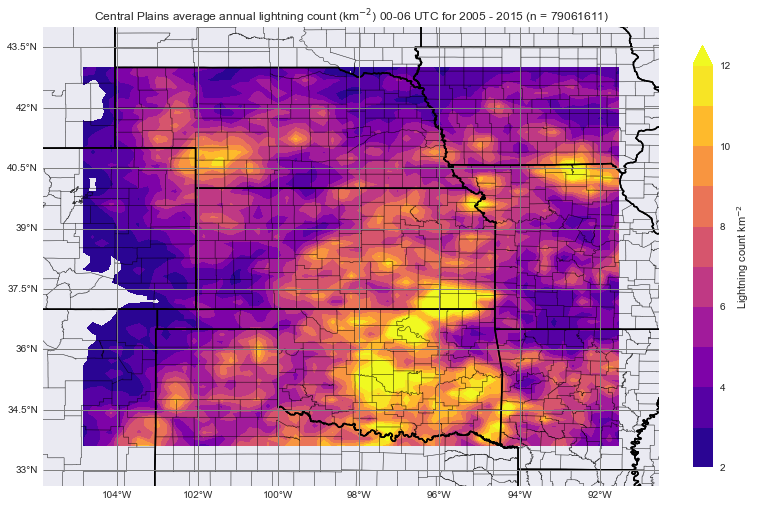

In [138]:
plt.style.use('seaborn')
from calendar import month_name

def calc_area_grid(xgrid, ygrid):
    
    a = 6371
    ydiff = np.diff(ygrid)
    xdiff = np.diff(xgrid)
    ydist = a*np.deg2rad(ydiff[0])
    xdist = (a*np.cos(np.deg2rad(ygrid))*np.deg2rad(xdiff[0])).mean()
    return xdist*ydist

month = 6
hour = 6
#total_freqs = by_month_counts[month]
total_freqs = np.sum([by_hour_counts[hour] for hour in range(6)], axis=0)
lightning_by_area = total_freqs.T/(gridboxarea*11)
quantiles = np.percentile(lightning_by_area, [5, 99])
if quantiles[0] >= 1:
    delta = int((int(quantiles[1])-int(quantiles[0]))/20)
    if delta < 1:
        delta = 1
    clevs = np.arange(int(quantiles[0]), int(quantiles[1]), delta)
    print(clevs)
    print(delta)
else:
    delta = (quantiles[1]-quantiles[0])/20
    clevs = np.arange(quantiles[0], quantiles[1], delta)
    
data_crs = ccrs.PlateCarree()
plot_crs = ccrs.LambertConformal(central_latitude=40, central_longitude=-83)
gridboxarea = calc_area_grid(xgrid, ygrid)

fig, ax = plt.subplots(figsize=(12,10), subplot_kw=dict(projection=data_crs))

ax.add_feature(USCOUNTIES.with_scale('500k'), linewidths=0.5, alpha=0.5)
ax.add_feature(USSTATES.with_scale('500k'), linewidths=1.5)

ax.set_extent([coord_list[3]-1, coord_list[2]+1, coord_list[0]-1, coord_list[1]+1])

fill_cons = ax.contourf(lightning_by_area, extent=[xgrid.min(), xgrid.max(),ygrid.min(), ygrid.max()], levels=clevs, cmap='plasma', transform=data_crs, extend='max')
#light_cons = ax.contour(lightning_by_area, extent=[xgrid.min(), xgrid.max(),ygrid.min(), ygrid.max()], levels=clevs, colors='black', linewidths=0.5, transform=data_crs)
#if clevs[0] >= 1:
    #ax.clabel(light_cons, fmt='%d')
#else:
    #ax.clabel(light_cons, fmt='%1.3f')
gl1 = ax.gridlines(draw_labels = True, color='gray', x_inline=False, y_inline=False)
gl1.top_labels=False
gl1.right_labels=False

fig.colorbar(fill_cons, ax=ax, orientation='vertical', fraction=0.03, label='Lightning count km$^{-2}$')
ax.set_title(f'Central Plains average annual lightning count (km$^{{-2}}$) 00-06 UTC for 2005 - 2015 (n = {total_freqs.sum():.0f})')
plt.show()
fig.savefig(pathlib.Path.home() / 'OneDrive - The Ohio State University' / 'CentralPlains_lightning_density_map.png', bbox_inches='tight', dpi=300)

In [78]:
np.percentile(lightning_by_area, [10, 90])

array([0.01099774, 0.0852325 ])

In [ ]:
counts_by_date.index = pd.to_datetime(counts_by_date.index)
counts_by_date.resample('1M').sum().plot()

In [ ]:
ohio_data.index = pd.to_datetime(ohio_data.Datetime)
counts = ohio_data.groupby(ohio_data.index.date).Latitude.count().rename_axis('Count')
counts
#counts = new_dataframe.groupby(new_dataframe.index.date).Latitude.count().rename(columns={'Latitude': 'Count'})

In [ ]:
ohio_data.index = pd.to_datetime(ohio_data.Datetime)
counts = ohio_data.groupby(ohio_data.index.date).count().Latitude
counts.set_index(pd.to_datetime(counts).date)
#counts = new_dataframe.groupby(new_dataframe.index.date).Latitude.count().rename(columns={'Latitude': 'Count'})
#counts.resample('1W').sum().plot()

In [ ]:
def get_regional_dataframe3(df, region_list):
    
    lon0 = region_list[2]
    lon1 = region_list[3]
    lat0 = region_list[0]
    lat1 = region_list[1]
    
    cond_str = f'(Latitude <= {lat1}) & (Latitude >= {lat0}) & (Longitude <= {lon0}) & (Longitude >= {lon1})'
    return df.query(cond_str)

file_path = pathlib.Path(r"C:\Users\steiner.273\OneDrive - The Ohio State University\Lightning Data")
file_list = list(file_path.rglob('*.txt'))
test_file = file_list[0]
test_data = pd.read_csv(test_file, delim_whitespace=True, names=column_names, header=None, nrows=2e5)

In [ ]:
%timeit get_regional_dataframe(test_data, coord_list)

In [ ]:
%timeit get_regional_dataframe2(test_data, coord_list)

In [ ]:
%timeit get_regional_dataframe3(test_data, coord_list)

In [ ]:
region_test = lambda x: ((x.Latitude.le(coord_list[0]).any())&(x.Latitude.ge(coord_list[1]).any()))&((x.Longitude.le(coord_list[2]).any())&(x.Longitude.ge(coord_list[3]).any()))
region_test2 = lambda x: ((x.Latitude <= coord_list[0]).any())&((x.Latitude >= coord_list[1]).any())&((x.Longitude <= coord_list[2]).any())&((x.Longitude >= coord_list[3])).any()
region_test3 = lambda x: 

%timeit region_test(test_data)

In [ ]:
%timeit region_test2(test_data)

In [ ]:
%timeit test_data['Datetime'] = pd.to_datetime((test_data['Date'] + ' ' + test_data['Time']).map(str))

In [ ]:
%timeit test_data['Datetime'] = pd.to_datetime(test_data['Date'] + ' ' + test_data['Time'])

In [ ]:
%timeit test_data['Datetime'] = test_data['Date'] + ' ' + test_data['Time']

In [ ]:
%timeit new_frame = pd.concat(df_list, axis=0)

In [ ]:
region_list = coord_list

lon0 = region_list[2]
lon1 = region_list[3]
lat0 = region_list[0]
lat1 = region_list[1]

cond = (test_data.Latitude.le(lat1) & test_data.Latitude.ge(lat0))&(test_data.Longitude.le(lon0) & test_data.Longitude.ge(lon1))
%timeit new_test_data = test_data[cond]

In [ ]:
columbus_df = new_dataframe[['Datetime', 'Latitude', 'Longitude']]
columbus_df.to_csv(file_dir / '39.5N40.5N82.5W83.5W_lightning_data.csv')

In [ ]:
file_dir = file.parent
file_list = list(file_dir.rglob('*.txt'))

In [ ]:
column_names = ['Date', 'Time', 'Latitude', 'Longitude', 'Charge', 'Num', 'C/G']
year_data = [pd.read_csv(file, delim_whitespace=True, names=column_names, header=None, chunksize=200000) for file in file_list]

In [ ]:
import time

freq_counts = []
for chunk in year_data:
    delta_t = 0
    year_counts = []
    for i, df in enumerate(chunk):
        begin = time.time()
        df['Datetime'] = pd.to_datetime((df['Date'] + ' ' + df['Time']).map(str))
        new_data = df[['Datetime', 'Num']]
        year_counts.append(new_data.Datetime.groupby(new_data.Datetime.map(lambda x: x.hour)).count())
        delta_t += time.time() - begin
        if i % 100 == 0:
            print(df.memory_usage().sum()/(1024**3))
            print(f'{delta_t:.3f} seconds')
    freq_counts.append(pd.concat(year_counts, axis=1).sum(axis=1).astype(np.int32))
    
total_freq = pd.concat(freq_counts, axis=1).sum(axis=1).astype(np.int32)

In [ ]:
total_freq.to_csv(file_dir / 'test_freq_count.csv')

In [ ]:
(total_freq/total_freq.sum()).plot(xlabel='Hour (UTC)', ylabel='Normalized Frequency', title='Lightning Frequency by Hour')

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import pathlib

data_file_path = pathlib.Path.home() / 'OneDrive - The Ohio State University'
data_file_name = '39.5N40.5N82.5W83.5W_lightning_data.csv'
full_file_path = data_file_path / data_file_name
columbus_area_data = pd.read_csv(full_file_path)
columbus_area_data = columbus_area_data[['Datetime', 'Latitude', 'Longitude']]
columbus_area_data = columbus_area_data.set_index(pd.to_datetime(columbus_area_data['Datetime']))
columbus_area_data = columbus_area_data[['Latitude', 'Longitude']]

#col_counts = columbus_area_data.groupby([columbus_area_data.index.map(lambda x: x.month), columbus_area_data.index.map(lambda x: x.hour)]).count().Latitude

In [ ]:
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from metpy.plots import USSTATES, USCOUNTIES
from scipy.stats import gaussian_kde
import cartopy.io.shapereader as shpreader
from cartopy.feature import ShapelyFeature

shapefile_name = '/Users/steiner/Downloads/tl_2016_39_cousub/tl_2016_39_cousub.shp'
interstate_shp = '/Users/steiner/Downloads/tl_2019_us_primaryroads/tl_2019_us_primaryroads.shp'
reader = shpreader.Reader(shapefile_name)
interstate_reader = shpreader.Reader(interstate_shp)

columbus_record = [record.geometry for record in reader.records() if 'Columbus' in record.attributes['NAMELSAD']]

roads_list = [record.geometry for record in interstate_reader.records()]
columbus_city = ShapelyFeature(columbus_record, ccrs.PlateCarree(), facecolor='white',alpha=0.4, linewidths=.4, edgecolor='black')
roads = ShapelyFeature(roads_list, ccrs.PlateCarree(), facecolor='none', linewidth=0.3, edgecolor='black')
city_locs = {record.attributes['NAME']: record.geometry.centroid for record in reader.records() if 'city' in record.attributes['NAMELSAD']}
xs = [val.x for val in city_locs.values()]
ys = [val.y for val in city_locs.values()]

title_dict = {'Winter': 'Dec-Jan-Feb', 'Spring': 'Mar-Apr-May', 'Summer': 'Jun-Jul-Aug', 'Fall': 'Sep-Oct-Nov'}
plot_crs = ccrs.LambertConformal(central_longitude=-83, central_latitude=40)
data_crs = ccrs.PlateCarree()

col_groups = columbus_area_data.groupby([columbus_area_data.index.map(lambda x: x.month)])
month_groups_dict = {group[0]: group[1] for group in col_groups}
time_of_day = [list(range(0, 6)), list(range(6, 12)), list(range(12, 18)), list(range(18, 24))]
nbins = 20
kdenbins = 30
seasons = {'Winter': (12,1,2), 'Spring': (3,4,5), 'Summer': (6,7,8), 'Fall': (9,10,11)}
for season in seasons.keys():
    summer_months = pd.concat([month_groups_dict[mo] for mo in seasons[season]], axis=0)
    summer_months_group_by_hour = summer_months.groupby(summer_months.index.map(lambda x: x.hour))
    for hour_list in time_of_day:
        timeframe_df = pd.concat([group[1] for group in summer_months_group_by_hour if group[0] in hour_list], axis=0)

        lats = timeframe_df.Latitude.values
        lons = timeframe_df.Longitude.values

        k = gaussian_kde([lons, lats])
        xi, yi = np.mgrid[lons.min()-0.5:lons.max()+0.5:kdenbins*1j, lats.min()-0.5:lats.max()+0.5:kdenbins*1j]
        zi = k(np.vstack([xi.flatten(), yi.flatten()]))

        fig, axs = plt.subplots(1, 2, figsize=(15,10),subplot_kw=dict(projection=plot_crs))

        dens = axs[0].hist2d(lons, lats, bins=nbins, density=False, cmap = 'Reds', transform=data_crs)

        valmin = dens[0].min()
        valmax = dens[0].max()

        axs[0].add_feature(USSTATES.with_scale('500k'))
        axs[0].add_feature(USCOUNTIES.with_scale('500k'), linewidths=1.5, edgecolor='black')
        axs[0].add_feature(columbus_city)
        axs[0].add_feature(roads)

        axs[0].set_extent([-83.5, -82.5, 39.5, 40.5])
        axs[0].scatter(xs, ys, marker='o',c='black',s=9,transform=data_crs)

        #city_test_func = lambda c: ((c.x <= -82.5)&(c.x>=-83.5))&((c.y<=40.5)&(c.y>=39.5))

        #for x, y, (city_name, center) in zip(xs, ys, city_locs.items()):
            #if city_test_func(center) and city_name == 'Columbus':
                #axs[0].text(x-0.01, y+0.01, city_name, fontweight='bold', transform=data_crs)
        
        gl1 = axs[0].gridlines(draw_labels = True, color='gray', x_inline=False, y_inline=False)
        gl1.top_labels=False
        gl1.right_labels=False
        fig.colorbar(dens[3],ax=axs[0], orientation='vertical', fraction=0.04)

        #kde_density_map = axs[1].pcolormesh(xi, yi, zi.reshape(xi.shape), vmin=0.2, vmax=3., shading='gouraud', cmap='Reds', transform=data_crs)
        kde_density_map = axs[1].contourf(xi, yi, zi.reshape(xi.shape), levels=np.arange(0.2, 2.05, 0.05), 
                                            cmap='Reds', extend='max', transform=data_crs)
        
        axs[1].set_extent([-83.5, -82.5, 39.5, 40.5])
        axs[1].add_feature(USSTATES.with_scale('500k'))
        axs[1].add_feature(USCOUNTIES.with_scale('500k'), linewidths=1.5,edgecolor='black')
        axs[1].add_feature(columbus_city)
        axs[1].add_feature(roads)

        axs[1].scatter(xs, ys, marker='o',c='black',s=9,transform=data_crs)

        #for x, y, (city_name, center) in zip(xs, ys, city_locs.items()):
            #if city_test_func(center) and city_name == 'Columbus':
                #axs[1].text(x-0.01, y+0.01, city_name, fontweight='bold', transform=data_crs)
        
        gl = axs[1].gridlines(draw_labels = True, color='gray', x_inline=False, y_inline=False)
        gl.top_labels=False
        gl.right_labels=False
        gl.left_labels=False
        cb = fig.colorbar(kde_density_map, ax=axs[1], orientation='vertical', fraction=0.04)
        cb.set_label('Lightning Density', labelpad=10)

        axs[0].set_title('2D histogram of lightning')
        axs[1].set_title('KDE Gaussian density map')
        fig.suptitle(f'Lightning heat map ({title_dict[season]} 2005-2015 between {str(hour_list[0]).zfill(2)} and {str(hour_list[-1]).zfill(2)} UTC): n = {len(lats)}', 
                 x=0.5, y=0.88, fontweight='bold', fontsize=14)
        plt.show()
        fig.savefig(pathlib.Path.home() / 'Documents' / 'lightning_images' / f'lightning_heat_map_Columbus_{title_dict[season]}_{hour_list[0]}_{hour_list[-1]}UTC.png', 
                    bbox_inches='tight', facecolor='w', dpi=300)

In [ ]:
shapefile_name = '/Users/steiner/Downloads/tl_2016_39_cousub/tl_2016_39_cousub.shp'
interstate_shp = '/Users/steiner/Downloads/tl_2019_us_primaryroads/tl_2019_us_primaryroads.shp'
reader = shpreader.Reader(shapefile_name)
interstate_reader = shpreader.Reader(interstate_shp)

columbus_record = [record.geometry for record in reader.records() if 'Columbus' in record.attributes['NAMELSAD']]

roads_list = [record.geometry for record in interstate_reader.records()]
columbus_city = ShapelyFeature(columbus_record, ccrs.PlateCarree(), facecolor='white',alpha=0.4, linewidths=.4, edgecolor='black')
roads = ShapelyFeature(roads_list, ccrs.PlateCarree(), facecolor='none', linewidth=0.3, edgecolor='black')
city_locs = {record.attributes['NAME']: record.geometry.centroid for record in reader.records() if 'city' in record.attributes['NAMELSAD']}
xs = [val.x for val in city_locs.values()]
ys = [val.y for val in city_locs.values()]

timeframe_df = columbus_area_data
lats = timeframe_df.Latitude.values
lons = timeframe_df.Longitude.values

k = gaussian_kde([lons, lats])
xi, yi = np.mgrid[lons.min()-0.5:lons.max()+0.5:kdenbins*1j, lats.min()-0.5:lats.max()+0.5:kdenbins*1j]
zi = k(np.vstack([xi.flatten(), yi.flatten()]))

fig, axs = plt.subplots(1, 2, figsize=(15,10),subplot_kw=dict(projection=plot_crs))

dens = axs[0].hist2d(lons, lats, bins=nbins, density=False, cmap = 'Reds', transform=data_crs)

valmin = dens[0].min()
valmax = dens[0].max()

axs[0].add_feature(USSTATES.with_scale('500k'))
axs[0].add_feature(USCOUNTIES.with_scale('500k'), linewidths=1.5, edgecolor='black')
axs[0].add_feature(columbus_city)
axs[0].add_feature(roads)

axs[0].set_extent([-83.5, -82.5, 39.5, 40.5])
axs[0].scatter(xs, ys, marker='o',c='black',s=9,transform=data_crs)

        #city_test_func = lambda c: ((c.x <= -82.5)&(c.x>=-83.5))&((c.y<=40.5)&(c.y>=39.5))

        #for x, y, (city_name, center) in zip(xs, ys, city_locs.items()):
            #if city_test_func(center) and city_name == 'Columbus':
                #axs[0].text(x-0.01, y+0.01, city_name, fontweight='bold', transform=data_crs)
        
axs[0].grid(False)
gl1 = axs[0].gridlines(draw_labels = True, color='gray', x_inline=False, y_inline=False)
gl1.top_labels=False
gl1.right_labels=False
axs[0].grid(False)
fig.colorbar(dens[3],ax=axs[0], orientation='vertical', fraction=0.04)

        #kde_density_map = axs[1].pcolormesh(xi, yi, zi.reshape(xi.shape), vmin=0.2, vmax=3., shading='gouraud', cmap='Reds', transform=data_crs)
kde_density_map = axs[1].contourf(xi, yi, zi.reshape(xi.shape), levels=np.arange(0.5, 1.55, 0.05), 
                                    cmap='Reds', extend='both', transform=data_crs)
        
axs[1].set_extent([-83.5, -82.5, 39.5, 40.5])
axs[1].add_feature(USSTATES.with_scale('500k'))
axs[1].add_feature(USCOUNTIES.with_scale('500k'), linewidths=1.5,edgecolor='black')
axs[1].add_feature(columbus_city)
axs[1].add_feature(roads)

axs[1].scatter(xs, ys, marker='o',c='black',s=9,transform=data_crs)

        #for x, y, (city_name, center) in zip(xs, ys, city_locs.items()):
            #if city_test_func(center) and city_name == 'Columbus':
                #axs[1].text(x-0.01, y+0.01, city_name, fontweight='bold', transform=data_crs)
        
axs[1].grid(False)
gl = axs[1].gridlines(draw_labels = True, color='gray', x_inline=False, y_inline=False)
gl.top_labels=False
gl.right_labels=False
gl.left_labels=False
cb = fig.colorbar(kde_density_map, ax=axs[1], orientation='vertical', fraction=0.04)
cb.set_label('Lightning Density', labelpad=10)

axs[0].set_title('2D histogram of lightning')
axs[1].set_title('KDE Gaussian density map')
fig.suptitle(f'Lightning heat map 2005-2015: n = {len(lats)}', 
            x=0.5, y=0.88, fontweight='bold', fontsize=14)
plt.show()
fig.savefig(pathlib.Path.home() / 'Documents' / 'lightning_images' / f'lightning_heat_map_Columbus_2005_2015.png', 
        bbox_inches='tight', facecolor='w', dpi=300)

In [ ]:
lon_grid = np.linspace(-83.5, -82.5, 4)
lat_grid = np.linspace(39.5, 40.5, 4)

columbus_area_data.index = pd.to_datetime(columbus_area_data.index)
new_lightning = columbus_area_data.groupby([pd.cut(columbus_area_data.Longitude, lon_grid), pd.cut(columbus_area_data.Latitude, lat_grid),
                                            columbus_area_data.index.map(lambda x: x.date)]).count()['Latitude'].rename('Count').reset_index()
new_lightning.columns = ['Longitude', 'Latitude', 'Date', 'Count']
ng = new_lightning.groupby(['Longitude', 'Latitude'])[['Date', 'Count']]


In [ ]:
plt.style.use('seaborn')
import matplotlib.colors as mcolors

newer_test = new_lightning.groupby(['Longitude', 'Latitude'])[['Date', 'Count']]
sectors = [pd.cut(columbus_area_data.Longitude, lon_grid), pd.cut(columbus_area_data.Latitude, lat_grid)]
group_list = [g[1].set_index(pd.to_datetime(g[1].Date))['Count'] for g in newer_test]
cardinal_directions = ['SW', 'W', 'NW', 'S', 'C', 'N', 'SE', 'E', 'NE']
list_of_sectors = [g[0] for g in newer_test]
colors = random.sample(list(mcolors.TABLEAU_COLORS), 9)

fig, ax = plt.subplots(figsize=(12,10))
for i, series in enumerate(group_list):
    series.groupby(series.index.map(lambda x: x.dayofyear)).mean().cumsum().plot(ax=ax, color=colors[i], label=cardinal_directions[i])
ax.legend(loc='upper left')
ax.set_xlabel('Day of Year')
ax.set_ylabel('Lightning Count')
ax.set_ylim(0,50000)
ax.set_title('Cumulative lightning count average by sector (2005-2015)')
fig.savefig(pathlib.Path.home() / 'Documents' / 'lightning_images' / 'cumulative_time_series_lightning_count_by_sector.png', 
            bbox_inches='tight', facecolor='w', dpi=300)
plt.show()

In [ ]:
from calendar import month_name

lon_grid = np.linspace(-83.5, -82.5, 4)
lat_grid = np.linspace(39.5, 40.5, 4)

columbus_area_data.index = pd.to_datetime(columbus_area_data.index)
new_lightning_hour = columbus_area_data.groupby([pd.cut(columbus_area_data.Longitude, lon_grid), pd.cut(columbus_area_data.Latitude, lat_grid),
                                            columbus_area_data.index.map(lambda x: x.month), 
                                                 columbus_area_data.index.map(lambda x: x.hour)]).count()

new_index = new_lightning_hour.index.rename(['Longitude', 'Latitude', 'Month', 'Hour'])
new_lightning_hour.index = new_index
new_lightning_hour.columns = ['1', '2']
month = 12
fig, ax = plt.subplots(figsize=(12,10))
for i, sector in enumerate(list_of_sectors):
    new_data = new_lightning_hour[(new_lightning_hour.index.get_level_values('Longitude')==sector[0])&(new_lightning_hour.index.get_level_values('Latitude')==sector[1])]
    month_data = new_data[new_data.index.get_level_values('Month')==month]['1']
    #month_data = new_data.groupby('Hour')['1'].sum() / 10
    ax.plot(month_data.index.get_level_values('Hour'), month_data.values, color=colors[i], label=cardinal_directions[i])
    
ax.legend(loc='best')
ax.set_xlabel('Hour of Day (UTC)')
ax.set_ylabel('Lightning Count')
ax.set_title(f'Hourly lightning count {month_name[month]} (2005-2015)')

plt.show()

fig.savefig(pathlib.Path.home() / 'Documents' / 'lightning_images' / f'hourly_{month_name[month]}_count_time_series_by_sector.png', bbox_inches='tight',
            facecolor='w', dpi=300)

In [ ]:
from matplotlib import colors
import random

colors = random.sample(list(colors.TABLEAU_COLORS), 9)

In [ ]:
colors

In [ ]:
daily_counts = columbus_area_data.groupby(columbus_area_data.index.map(lambda x: x.date)).count()['Latitude'].rename('Count')
daily_counts.index = pd.to_datetime(daily_counts.index)
new_daily = daily_counts.resample('1D').sum()
(new_daily.resample('1M').sum().diff()).plot(figsize=(15,10), grid=True)

In [ ]:
lon_grid = np.linspace(-83.5, -82.5, 4)
lat_grid = np.linspace(39.5, 40.5, 4)

new_sectors = columbus_area_data.groupby([columbus_area_data.index.map(lambda x: x.month), columbus_area_data.index.map(lambda x: x.hour),
                                          pd.cut(columbus_area_data.Longitude, lon_grid), pd.cut(columbus_area_data.Latitude, lat_grid)]).count()

hour_list = list(range(18,24))+list(range(5))
hour2_list = list(range(6, 15))

time_of_day = [list(range(0, 6)), list(range(6, 12)), list(range(12, 18)), list(range(18, 24))]
tidx = 3
seasons = {'Winter': (12,1,2), 'Spring': (3,4,5), 'Summer': (6,7,8), 'Fall': (9,10,11)}
season='Fall'

newindex = new_sectors.index.rename(['Month', 'Hour', 'Longitude', 'Latitude'])
new_sectors.index=newindex
new_sectors.columns=['1','2']
summer_test = new_sectors[new_sectors.index.get_level_values('Month').isin(seasons[season])].groupby(by=['Hour', 'Latitude', 'Longitude']).sum()['1'].to_frame()
afternoon_summer_test = summer_test[summer_test.index.get_level_values('Hour').isin(time_of_day[tidx])].groupby(['Latitude', 'Longitude']).sum()['1']
#summer_test = new_sectors.groupby(new_sectors
#summer_dfs = {mo: new_sectors[mo] for mo in season}
#summer_dfs[6][range(6)]
#cnew_groups = new_sectors.groupby([new_sectors.index.map(lambda x: x.month), new_sectors.index.map(lambda x: x.hour)])

In [ ]:
lon_grid = np.linspace(-83.5, -82.5, 4)
lat_grid = np.linspace(39.5, 40.5, 4)

lon2d, lat2d = np.meshgrid(lon_grid, lat_grid)

#total_df = afternoon_summer_test
#test = total_df.groupby([pd.cut(total_df.Longitude, lon_grid), pd.cut(total_df.Latitude, lat_grid)]).count().Latitude

test = afternoon_summer_test
lightning_proportion = test.values.reshape((3,3))/test.values.sum()

fig, ax = plt.subplots(figsize=(12,10), subplot_kw=dict(projection=plot_crs))

ax.add_feature(USSTATES.with_scale('500k'))
ax.add_feature(USCOUNTIES.with_scale('500k'), linewidths=1.5, edgecolor='black')
ax.add_feature(columbus_city)
ax.add_feature(roads)

ax.set_extent([-83.5, -82.5, 39.5, 40.5])
ax.scatter(xs, ys, marker='o',c='black',s=9,transform=data_crs)
lightning_counts = ax.pcolormesh(lon_grid, lat_grid, lightning_proportion, vmin=0., vmax=0.3, cmap='Reds', transform=data_crs, zorder=-1)

cb = fig.colorbar(lightning_counts, ax=ax, orientation='vertical', fraction=0.04)
cb.set_label('Lightning count', labelpad = 10)

gl = ax.gridlines(draw_labels = True, color='gray', x_inline=False, y_inline=False)
gl.top_labels=False
gl.right_labels=False

ax.set_title(f'Lightning freq. from {str(time_of_day[tidx][0]).zfill(2)} to {str(time_of_day[tidx][-1]).zfill(2)} UTC ({title_dict[season]} 2005-2015): n = {np.sum(test)}', 
             fontsize=12)
plt.show()

fig.savefig(pathlib.Path.home() / 'Documents' / f'lightning_freq_{time_of_day[tidx][0]}_{time_of_day[tidx][-1]}UTC_{title_dict[season]}.png', 
            bbox_inches='tight', dpi=300, facecolor='w')

In [ ]:
columbus_area_data

In [ ]:
ydist = np.mean(np.diff(np.deg2rad(dens[2]))*6371)
lon_delta = np.diff(np.deg2rad(dens[1]))
xdist = np.cos(np.deg2rad(dens[2]))*6371*lon_delta[0]
area_matrix = xdist*ydist
mean_area = area_matrix.mean()
mean_area

In [ ]:
normalized_by_area = round(1/(0.05**2))
normalized_by_area / area_matrix.mean()

In [ ]:
for record in reader.records():
    if 'city' in record.attributes['NAMELSAD']:
        print(record.attributes)

In [ ]:
indexnames = col_counts.index.rename(['Month', 'Hour'])
col_counts.index = indexnames
col_counts.rename('Lightning Count')

In [ ]:
month_list = [None, 'January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']
image_path = pathlib.Path(r'C:/Users/steiner.273/OneDrive - The Ohio State University')

for month in range(1, 13):
    fig, ax = plt.subplots(figsize=(14,10))

    (col_counts[month]/col_counts[month].sum()).plot.area(ax=ax, color='lightblue', linewidth=1.5, x='Hour (UTC)', rot=0, y='Count')

    ax.set_ylim(0, 0.4)
    ax.set_title(f'Lightning Frequency by Hour for {month_list[month]} in the Columbus area', fontsize=13, fontweight='bold')
    plt.show()
    fig.savefig(image_path / f'{month_list[month]}_lightning_frequency.png', bbox_inches='tight')

In [ ]:
fig, ax = plt.subplots(figsize=(14,10))

month_counts = pd.Series([col_counts[i,].sum() for i in range(1, 13)], index=list(range(1,13)))
(month_counts/month_counts.sum()).plot.area(ax=ax, color='lightblue')
xlab = ax.set_xlabel('Month')
xlab.set_fontsize(12)
xlab.set_fontweight('bold')
ylab = ax.set_ylabel('Lightning Frequency')
ylab.set_fontsize(12)
ylab.set_fontweight('bold')
ax.set_xticks(list(range(len(month_list))))
ax.set_xticklabels(month_list, rotation=30)
ax.set_title('Lightning Frequency by Month (2005-2015) for Columbus, OH', fontweight='bold', fontsize=14)
plt.show()
fig.savefig(image_path / 'monthly_lightning_frequency_Columbus.png', bbox_inches='tight', dpi=300)

In [ ]:
import cartopy.io.shapereader as shpreader
from cartopy.feature import ShapelyFeature


shapefile_name = '/Users/steiner/Downloads/tl_2016_39_cousub/tl_2016_39_cousub.shp'
reader = shpreader.Reader(shapefile_name)


In [ ]:

for record in reader.records():
    if 'Columbus' in record.attributes['NAMELSAD']:
        geom = record

columbus_city = ShapelyFeature([geom.geometry], ccrs.PlateCarree(), facecolor='lightgray', edgecolor='black', alpha=0.5)
fig, ax = plt.subplots(subplot_kw=dict(projection=plot_crs))

ax.add_feature(USCOUNTIES.with_scale('500k'), edgecolor='black')
ax.add_feature(columbus_city)

ax.set_extent([-84,-82,39.5,40.5])
ax.scatter([-83], [40], c='black', transform=data_crs)

plt.show()

In [ ]:
for record in reader.records():
    print(record.geometry)

In [ ]:
for geom in reader.geometries():
    print(geom)

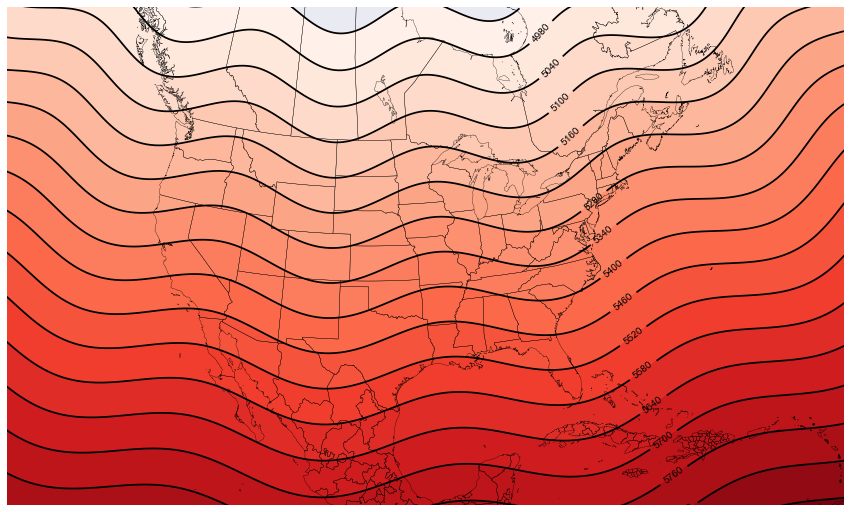

In [216]:
import numpy as np
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib.pyplot as plt
import metpy.calc as mpcalc
from metpy.units import units

x_grid = np.linspace(-180, 0, 360)
y_grid = np.linspace(0.5, 90, 179)

x2d, y2d = np.meshgrid(x_grid, y_grid)

f_param = mpcalc.coriolis_parameter(np.deg2rad(y2d))

geo_base = -20*y2d + 6100
cond = np.where(np.logical_and(y2d <= 50, y2d > 40), y2d, 0)
test = -0.2*cond
geo_pert = 15*np.cos(15*np.deg2rad(x2d)) + 20*np.sin(15*np.deg2rad(x2d))
geo_total = (geo_base+geo_pert)*units.meters

plot_crs = ccrs.LambertConformal(central_longitude=-100, central_latitude=40)
data_crs = ccrs.PlateCarree()

fig, ax = plt.subplots(figsize=(15,10), subplot_kw=dict(projection=plot_crs))
ax.add_feature(cfeature.STATES.with_scale('10m'))
ax.set_extent([-130, -60, 15, 55])

cons = ax.contourf(x2d, y2d, geo_total, levels=np.arange(4920, 6000, 60), cmap='Reds', transform=data_crs)
ncons = ax.contour(x2d, y2d, geo_total, levels=np.arange(4920, 6000, 60), colors='black', transform=data_crs)
ax.clabel(ncons, fmt='%d')
plt.show()

In [161]:
import xarray as xr

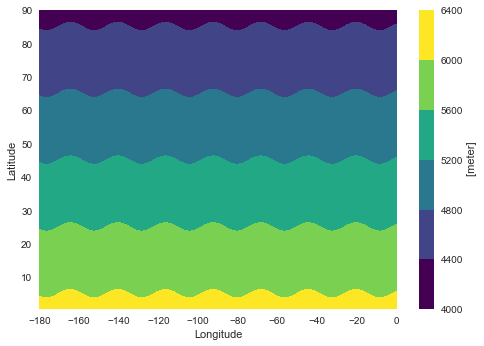

In [283]:
import metpy
new = xr.DataArray(geo_total, coords=[y_grid, x_grid], dims=['Latitude', 'Longitude'])
new.plot.contourf()

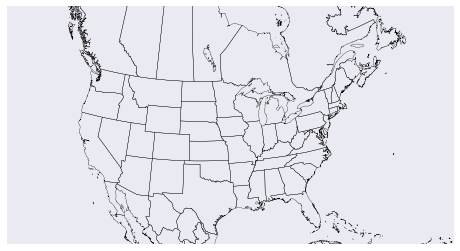

In [287]:
dx, dy = mpcalc.lat_lon_grid_deltas(x_grid, y_grid)

ugeo, vgeo = mpcalc.geostrophic_wind(new)

fig, ax = plt.subplots(subplot_kw=dict(projection=plot_crs))

ax.add_feature(cfeature.STATES.with_scale('10m'))

ax.set_extent([-130, -60, 20, 55])

speed = np.sqrt(ugeo**2+vgeo**2)

ax.contourf(x_grid, y_grid, speed)

plt.show()

In [224]:
geowind = np.sqrt(ugeo**2+vgeo**2)
geowind

Magnitude,[[0.46094933543590066 0.4568599614539441 0.4530234625833345 ... 0.46705694622724914 0.4641185634568055 0.4609812037117799] [0.2787096332685787 0.2728110160491356 0.2672080962369867 ... 0.2873879142206363 0.2832317192424851 0.27875531493235484] [nan nan nan ... nan nan nan] ... [nan nan nan ... nan nan nan] [nan nan nan ... nan nan nan] [nan nan nan ... nan nan nan]]
Units,meter/second


In [204]:
cond = np.where(np.logical_and(y2d <= 50, y2d > 40), y2d, 0)
test = -20*cond

3854.076658217555 <Unit('meter')>

In [1]:
import numpy as np
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib.pyplot as plt
import metpy.calc as mpcalc
from metpy.units import units
import xarray as xr
import pathlib

new_dir = pathlib.Path.home() / 'OneDrive - The Ohio State University'
upper_file = new_dir / 'Jan_1978' / 'Data' / 'Jan_1978_upper_data.nc'

upper_data = xr.open_dataset(upper_file)

In [2]:
upper_data

<xarray.Dataset>
Dimensions:    (longitude: 361, latitude: 221, level: 37, time: 144)
Coordinates:
  * longitude  (longitude) float32 -140.0 -139.8 -139.5 ... -50.5 -50.25 -50.0
  * latitude   (latitude) float32 70.0 69.75 69.5 69.25 ... 15.5 15.25 15.0
  * level      (level) int32 1 2 3 5 7 10 20 30 ... 850 875 900 925 950 975 1000
  * time       (time) datetime64[ns] 1978-01-23 ... 1978-01-28T23:00:00
Data variables:
    z          (time, level, latitude, longitude) float32 ...
    q          (time, level, latitude, longitude) float32 ...
    t          (time, level, latitude, longitude) float32 ...
    u          (time, level, latitude, longitude) float32 ...
    v          (time, level, latitude, longitude) float32 ...
    w          (time, level, latitude, longitude) float32 ...
Attributes:
    Conventions:  CF-1.6
    history:      2022-10-13 14:05:26 GMT by grib_to_netcdf-2.25.1: /opt/ecmw...

In [474]:
surface_file = new_dir / 'Jan_1978' / 'Data'/ 'Jan_1978_sfc_data.nc'
surface_data = xr.open_dataset(surface_file)

In [ ]:
parsed_upper_data = upper_data.metpy.parse_cf()
parsed_surface_data = surface_data.metpy.parse_cf()

In [477]:
geopotential = parsed_upper_data.z

In [ ]:
##calculate zonally averaged, time_averaged geopotential and wind

def time_formatter(time_val):
    
    x = pd.to_datetime(time_val)
    return f'{x.year}-{str(x.month).zfill(2)}-{str(x.day).zfill(2)} {str(x.hour).zfill(2)} UTC'

time_avg_geo = mpcalc.geopotential_to_height(geopotential.metpy.sel(level=pres_level).mean(axis=0)*units(geopotential.units))
time_avg_u = parsed_upper_data.u[:].metpy.sel(level=pres_level).mean(axis=0)*units.meters/units.seconds
time_avg_v = parsed_upper_data.v[:].metpy.sel(level=pres_level).mean(axis=0)*units.meters/units.seconds

zonal_avg_geo = time_avg_geo.mean(axis=1)
zonal_avg_u = time_avg_u.mean(axis=1)
zonal_avg_v = time_avg_v.mean(axis=1)

_, new_zonal_geo = np.meshgrid(time_avg_geo.metpy.x, zonal_avg_geo)
_, new_zonal_u = np.meshgrid(time_avg_u.metpy.x, zonal_avg_u)
_, new_zonal_v = np.meshgrid(time_avg_v.metpy.x, zonal_avg_v)

x2d, y2d = np.meshgrid(time_avg_geo.metpy.x, time_avg_geo.metpy.y)
dx, dy = mpcalc.lat_lon_grid_deltas(time_avg_geo.metpy.x, time_avg_geo.metpy.y)

new_zonal_geo = new_zonal_geo*units.meters
new_zonal_u = new_zonal_u*units.meters/units.seconds
new_zonal_v = new_zonal_v*units.meters/units.seconds
zonal_ugeo, zonal_vgeo = mpcalc.geostrophic_wind(new_zonal_geo, dx=dx, dy=dy, latitude=np.deg2rad(y2d))

for tidx in range(48, 108, 3):
    mslp = parsed_surface_data.msl.isel(time=tidx).metpy.convert_units('millibars')
    actual_u = parsed_upper_data.u[:].metpy.sel(level=pres_level).isel(time=tidx)*units.meters/units.seconds
    actual_v = parsed_upper_data.v[:].metpy.sel(level=pres_level).isel(time=tidx)*units.meters/units.seconds
    actual_geo = mpcalc.geopotential_to_height(geopotential.metpy.sel(level=pres_level).isel(time=tidx))

    actual_ugeo, actual_vgeo = mpcalc.geostrophic_wind(actual_geo)

    anom_u = actual_u - new_zonal_u
    anom_v = actual_v - new_zonal_v

    anom_geo = actual_geo - new_zonal_geo
    anom_ugeo = actual_ugeo - zonal_ugeo
    anom_vgeo = actual_vgeo - zonal_vgeo

    anom_uageo = anom_u - anom_ugeo
    anom_vageo = anom_v - anom_vgeo

    anom_ageo_div = mpcalc.smooth_n_point(mpcalc.divergence(anom_uageo, anom_vageo), 9, 25)
    div_units = anom_ageo_div.metpy.units
    
    fig, ax = plt.subplots(figsize=(12,10), subplot_kw=dict(projection=plot_crs))

    ax.set_extent([-110, -70, 22, 50])

    ax.add_feature(cfeature.STATES.with_scale('10m'))

    geocons = ax.contour(x2d, y2d, anom_geo, levels=np.arange(-600, 450, 50), colors='k', transform=data_crs)
    divcons = ax.contourf(x2d, y2d, anom_ageo_div*1e5, levels=np.arange(-12, 14, 2), extend='both', cmap='BrBG', transform=data_crs, zorder=-1)
    isobars = ax.contour(x2d, y2d, mslp, levels=np.arange(0, 2000, 4), colors='black', linestyles=':', linewidths=0.8, transform=data_crs)
    
    ax.quiver(x2d[wind_slice], y2d[wind_slice], anom_uageo[wind_slice].values, anom_vageo[wind_slice].values,
         transform=data_crs)

    ax.clabel(geocons, fmt='%d')
    ax.clabel(isobars, fmt='%d')
    gl1 = ax.gridlines(draw_labels = True, color='gray', x_inline=False, y_inline=False)
    gl1.top_labels=False
    gl1.right_labels=False
    fig.colorbar(divcons, ax=ax, orientation='vertical', label=f'1e^-5 {div_units}', fraction=0.04)
    time_stamp = time_formatter(actual_geo.time.values)
    ax.set_title(f'Valid for: {time_stamp}', loc='right')
    ax.set_title(f'300 mb perturbation geo height, ageostrophic wind and divergence', loc='left')
    plt.show()
    fig.savefig(new_dir / 'Jan_1978' / 'Ageostrophic_pert_div' / f'Jan_1978_{time_stamp}_ageo_div.png', bbox_inches='tight', facecolor='w', dpi=300)

In [482]:
import imageio.v2 as io

image_dir = new_dir / 'Jan_1978' / 'Ageostrophic_pert_div'
image_files = sorted(list(image_dir.rglob('*.png')))

with io.get_writer(image_dir / '300mb_ageo_pert_div_new.gif', mode='I', duration=1.0) as writer:
    for filename in image_files:
        image = io.imread(filename)
        writer.append_data(image)

In [ ]:
from datetime import datetime
import pandas as pd
plt.style.use('seaborn')

def time_formatter(time_val):
    
    x = pd.to_datetime(time_val)
    return f'{x.year}-{str(x.month).zfill(2)}-{str(x.day).zfill(2)} {str(x.hour).zfill(2)} UTC'

#calculate trenberth forcing (vorticity advection by the thermal wind)

tidx=18
wind_slice = (slice(None, None, 10), slice(None, None, 10))
#first, calculate 1000 - 500 mb thickness
for tidx in range(48, 108, 3):
    thickness1000_500 = mpcalc.geopotential_to_height(geopotential.isel(time=tidx).metpy.sel(level=500)) - mpcalc.geopotential_to_height(geopotential.isel(time=tidx).metpy.sel(level=1000))
    x2d, y2d = np.meshgrid(thickness1000_500.metpy.x, thickness1000_500.metpy.y)
    thickness1000_500 = mpcalc.smooth_n_point(thickness1000_500, 9, 25)

#calculate thermal wind

    uthermal, vthermal = mpcalc.geostrophic_wind(thickness1000_500)

#calculate geostrophic vorticity advection

    geo700 = mpcalc.geopotential_to_height(geopotential.isel(time=tidx).metpy.sel(level=700))
    smgeo700 = mpcalc.smooth_n_point(geo700, 9, 50)
    ugeo700, vgeo700 = mpcalc.geostrophic_wind(smgeo700)
    geo_vort700 = mpcalc.absolute_vorticity(ugeo700, vgeo700)
    geo_vortadv = mpcalc.advection(geo_vort700, uthermal, vthermal)
    adv_units = geo_vortadv.metpy.units
#convert u and v thermal wind

    uthermal = uthermal.metpy.convert_units('kts')
    vthermal = vthermal.metpy.convert_units('kts')

#then plot thickness
    timestamp = time_formatter(thickness1000_500.time.values)
    fig, ax = plt.subplots(figsize=(12,10), subplot_kw=dict(projection=plot_crs))
    ax.add_feature(cfeature.STATES.with_scale('10m'))

    ax.set_extent([-110, -70, 22, 50])
    thickness_cons = ax.contour(x2d, y2d, thickness1000_500, levels=np.arange(0, 6000, 60), colors='black', transform=data_crs)
    advcons = ax.contourf(x2d, y2d, geo_vortadv*1e8, levels=np.arange(-5, 5, 0.5), cmap='BrBG', extend='both', transform=data_crs, zorder=-1)
    vortcons = ax.contour(x2d, y2d, geo_vort700*1e5, levels=np.arange(5, 100, 5), colors='tab:red', linestyles='--', linewidths=1.2, transform=data_crs)
    ax.barbs(x2d[wind_slice], y2d[wind_slice], uthermal[wind_slice].values, vthermal[wind_slice].values,
            length=6.5, transform=data_crs)

    ax.clabel(thickness_cons, fmt='%d')
    ax.clabel(vortcons, fmt='%d')
    gl1 = ax.gridlines(draw_labels = True, color='gray', x_inline=False, y_inline=False)
    gl1.top_labels=False
    gl1.right_labels=False
    
    ax.set_title('Trenberth forcing, 1000-500 mb thickness/wind, 700 mb abs. vort. 1e-5 s$^{-1}$', loc='left')
    ax.set_title(f'{timestamp}', loc='right')
    fig.colorbar(advcons, orientation='vertical', label=f'1e-8 {adv_units}', fraction=0.04)
    plt.show()
    fig.savefig(new_dir / 'Jan_1978'/ 'Trenberth_forcing_maps' / f'Jan_1978_{timestamp}_thickness_trenberth.png', bbox_inches='tight', dpi=300, facecolor='w')
    

In [491]:
image_dir = new_dir / 'Jan_1978' / 'Trenberth_forcing_maps'
image_files = sorted(list(image_dir.rglob('*.png')))

with io.get_writer(image_dir / 'Jan1978_1000-500mbthickness_trenberth_gif.gif', mode='I', duration=1.0) as writer:
    for filename in image_files:
        image = io.imread(filename)
        writer.append_data(image)

/var/folders/dd/nn4vmjnn197f_0003jly08t40000gn/T/ipykernel_64060/416764861.py:40: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  fig.colorbar(theta_cons, ax=ax, orientation='vertical', label='K', fraction=0.04)


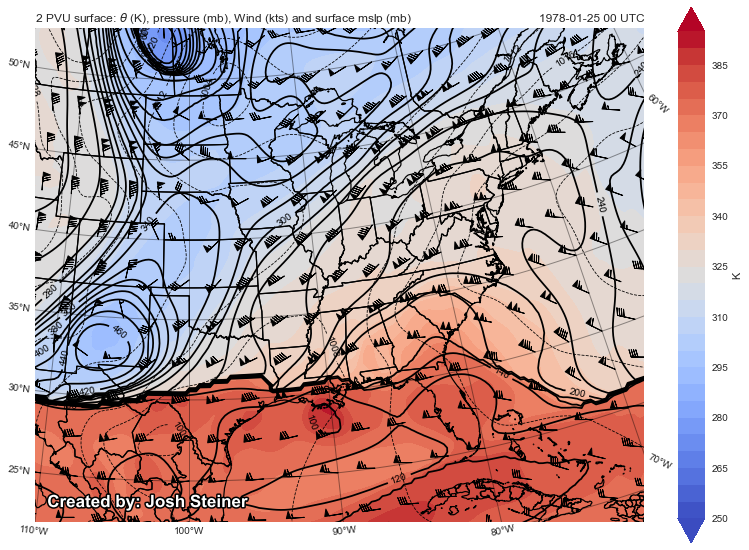

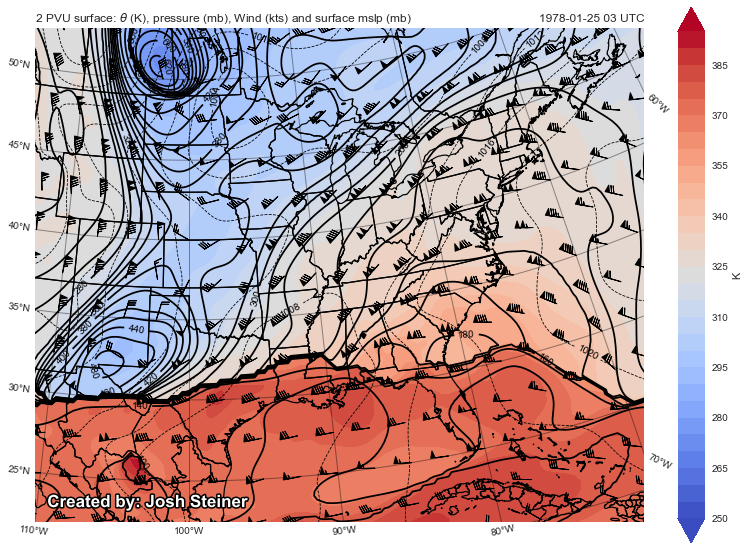

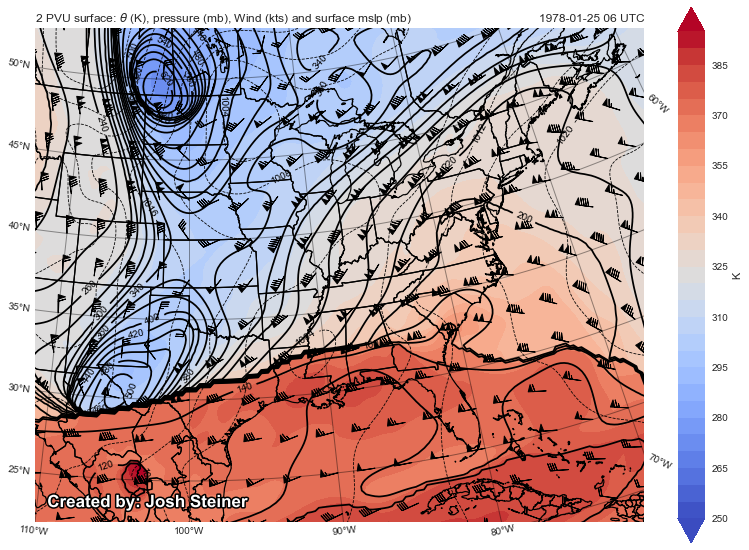

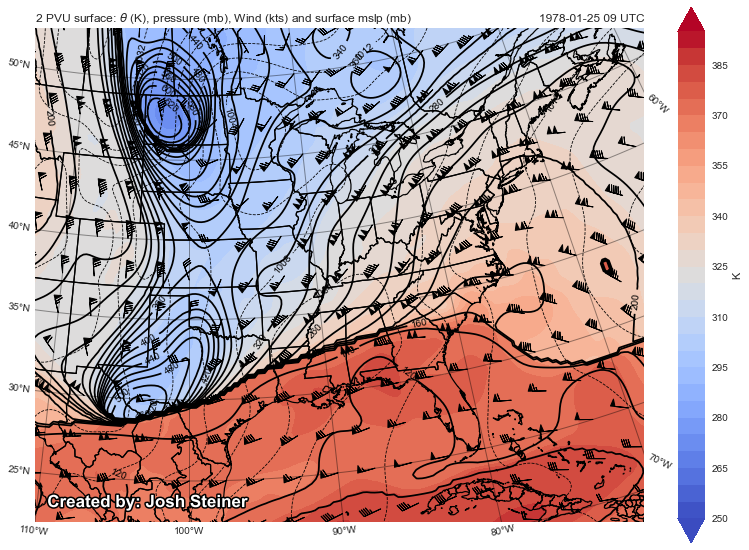

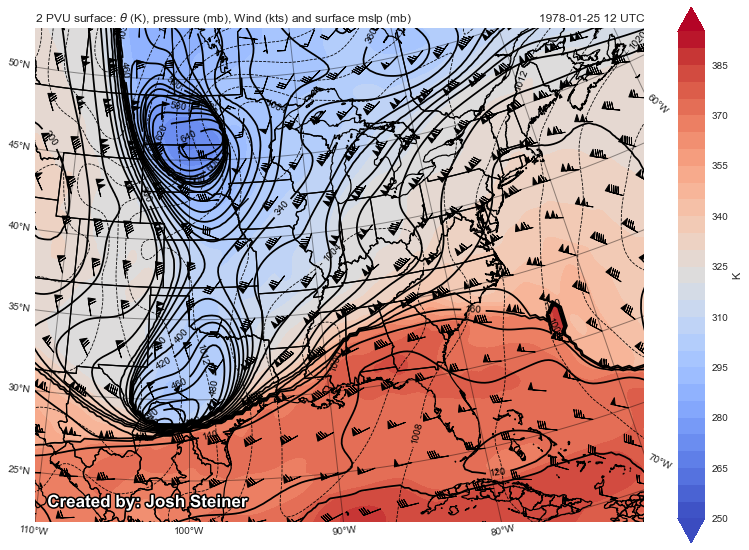

...

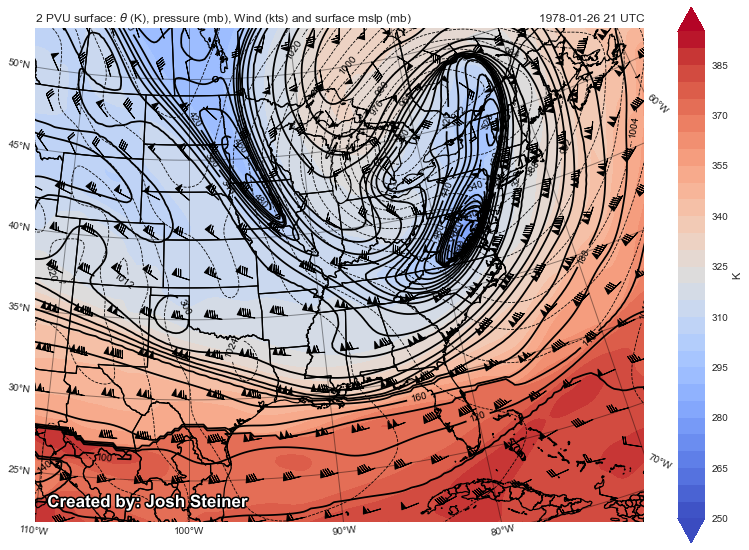

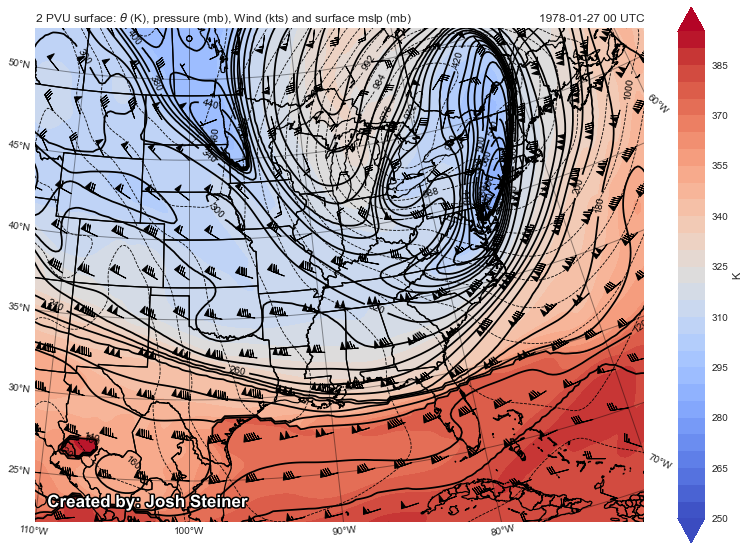

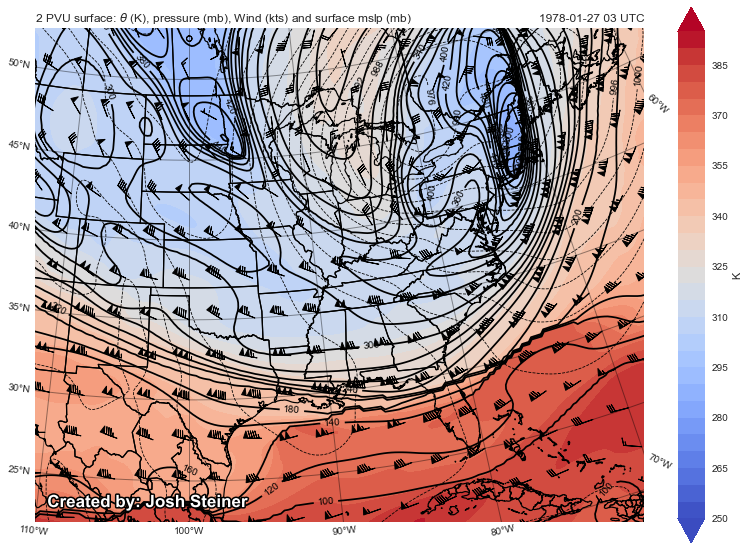

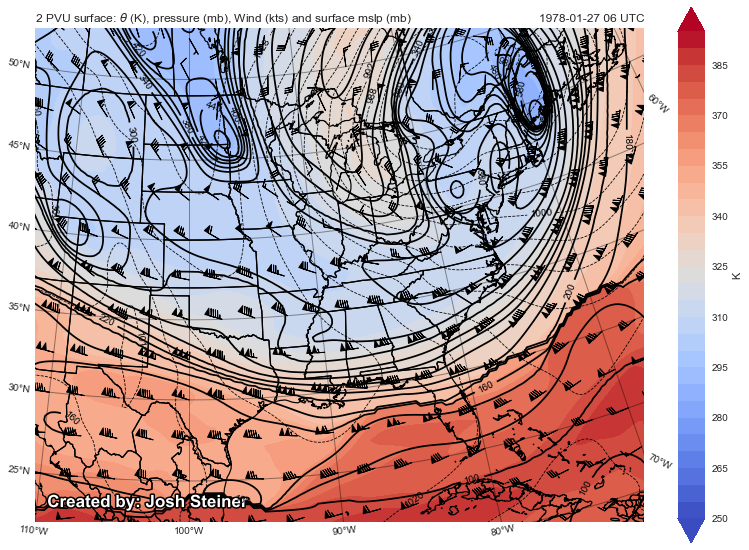

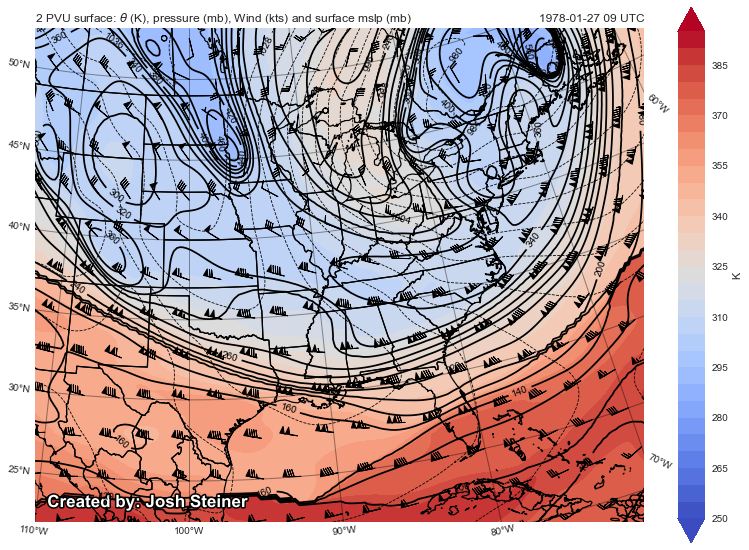

In [495]:
from metpy.interpolate import interpolate_to_isosurface
import matplotlib.patheffects as path_effects

##calculate 2 PVU surface and associated variables

#first need to calculate potential temperature at all levels
for tidx in range(48, 108, 3):
    pressure = parsed_upper_data.level.metpy.sel(level=slice(50,1000))
    tk = parsed_upper_data.t.isel(time=tidx).metpy.sel(level=slice(50,1000)) * units.kelvin
    u = parsed_upper_data.u.isel(time=tidx).metpy.sel(level=slice(50,1000)) * units.meters/units.seconds
    v = parsed_upper_data.v.isel(time=tidx).metpy.sel(level=slice(50,1000)) * units.meters/units.seconds

    pvu_units = units('m^2')*units('K')*units('s^-1')*units('kg^-1')
    theta = mpcalc.potential_temperature(pressure, tk)
    pot_vort = mpcalc.smooth_n_point(mpcalc.potential_vorticity_baroclinic(theta, pressure, u, v), 9, 50)
    new_pres = pressure.broadcast_like(pot_vort)
    theta_2pvu = interpolate_to_isosurface(pot_vort.values*pvu_units, theta.values*units.kelvin, 2e-6*pvu_units)
    pres_2pvu = interpolate_to_isosurface(pot_vort.values*pvu_units, new_pres.values*units.millibars, 2e-6*pvu_units)
    u_2pvu = interpolate_to_isosurface(pot_vort.values*pvu_units, u.values*units.meters/units.seconds, 2e-6*pvu_units)
    v_2pvu = interpolate_to_isosurface(pot_vort.values*pvu_units, v.values*units.meters/units.seconds, 2e-6*pvu_units)

    mslp = mpcalc.smooth_n_point(surface_data.msl.isel(time=tidx).metpy.convert_units('hPa'), 9, 25)
    
    fig, ax = plt.subplots(figsize=(12,10), subplot_kw=dict(projection=plot_crs))
    ax.add_feature(cfeature.STATES.with_scale('10m'), linewidths=1.2)
    wind_slice = (slice(None, None, 10), slice(None, None, 10))
    ax.set_extent([-110, -70, 22, 50])

    ukts = u_2pvu * 1.944
    vkts = v_2pvu * 1.944
    cons = ax.contour(x2d, y2d, pres_2pvu, levels=np.arange(60, 1000, 20), colors='black', transform=data_crs)
    isobars = ax.contour(x2d, y2d, mslp, levels=np.arange(0, 2000, 4), colors='black', linestyles='--', linewidths=0.8,transform=data_crs)
    ax.barbs(x2d[wind_slice], y2d[wind_slice], ukts[wind_slice].m, vkts[wind_slice].m,
             length=6., transform=data_crs)

    theta_cons = ax.contourf(x2d, y2d, theta_2pvu, levels=np.arange(250, 400, 5), cmap='coolwarm', extend='both', transform=data_crs, zorder=-1)
    ax.clabel(cons, fmt='%d')
    ax.clabel(isobars, fmt='%d')
    ax.grid(False)
    fig.colorbar(theta_cons, ax=ax, orientation='vertical', label='K', fraction=0.04)
    gl1 = ax.gridlines(draw_labels = True, color='black', linestyles=':', alpha=0.4, x_inline=False, y_inline=False)
    gl1.top_labels=False
    gl1.right_labels=False
    ax.set_title(r'2 PVU surface: $\theta$ (K), pressure (mb), Wind (kts) and surface mslp (mb)', loc='left')
    text = ax.text(0.02, 0.03, 'Created by: Josh Steiner', fontweight='bold', color='w', fontsize=17, transform=ax.transAxes)
    text.set_path_effects([path_effects.Stroke(linewidth=3, foreground='black'),
                       path_effects.Normal()])
    time_stamp = time_formatter(mslp.time.values)
    ax.set_title(f'{time_stamp}', loc='right')
    plt.show()
    fig.savefig(new_dir / 'Jan_1978' / '2PVU_surface_maps' / f'2PVU_surface_Jan_1978_{time_stamp}.png', facecolor='w', bbox_inches='tight', dpi=300)

In [496]:
image_dir = pathlib.Path.home() / 'OneDrive - The Ohio State University' / 'Jan_1978' / '2PVU_surface_maps'

In [225]:
import imageio

In [497]:
import imageio.v2 as io

image_files = sorted(list(image_dir.rglob('*.png')))

In [498]:
with io.get_writer(image_dir / '2PVU_surface_gif_Jan1978.gif', mode='I', duration=1.0) as writer:
    for filename in image_files:
        image = io.imread(filename)
        writer.append_data(image)

In [ ]:
#calculate static_stability

tidx = 36

pressure = (parsed_upper_data.level.metpy.sel(level=slice(50,1000))*100)*units.Pa
tk = parsed_upper_data.t.isel(time=tidx).metpy.sel(level=slice(50,1000))
u = parsed_upper_data.u.isel(time=tidx).metpy.sel(level=slice(50,1000))
v = parsed_upper_data.v.isel(time=tidx).metpy.sel(level=slice(50,1000))

sigma = mpcalc.static_stability(pressure, tk)

fig, ax = plt.subplots(figsize=(12,10),subplot_kw=dict(projection=plot_crs))

ax.add_feature(cfeature.STATES.with_scale('10m'))
ax.set_extent([-100, -60, 22, 50])

sigma.metpy.sel(level=slice(700, 1000)).mean(axis=0).plot.contourf(ax=ax, levels=np.arange(0.5e-6, 4e-6, 0.1e-6), cmap='coolwarm_r', transform=data_crs, zorder=-1)

In [ ]:
#calculate theta_e surfaces

pressure = parsed_upper_data.level.metpy.sel(level=slice(1,1000))
theta_surface = 305*units.kelvin

for tidx in range(48, 108, 3):
    mslp = parsed_surface_data.msl.isel(time=tidx).metpy.convert_units('millibars')
    tk = parsed_upper_data.t.isel(time=tidx).metpy.sel(level=slice(1,1000))
    u = parsed_upper_data.u.isel(time=tidx).metpy.sel(level=slice(1,1000))
    v = parsed_upper_data.v.isel(time=tidx).metpy.sel(level=slice(1,1000))
    q = parsed_upper_data.q.isel(time=tidx).metpy.sel(level=slice(1,1000))

    dp = mpcalc.dewpoint_from_specific_humidity(pressure, tk, q)
    theta_e = mpcalc.equivalent_potential_temperature(pressure, tk, dp)
    new_pres = pressure.broadcast_like(theta_e)
    k320_pres = interpolate_to_isosurface(theta_e.values*units.kelvin, new_pres.values*units.millibars, theta_surface)
    u320 = interpolate_to_isosurface(theta_e.values*units.kelvin, u.values*units.meters/units.seconds, theta_surface)
    v320 = interpolate_to_isosurface(theta_e.values*units.kelvin, v.values*units.meters/units.seconds, theta_surface)

    fig, ax = plt.subplots(figsize=(12,10),subplot_kw=dict(projection=plot_crs))

    ax.add_feature(cfeature.STATES.with_scale('10m'))
    ax.set_extent([-110, -70, 22, 50])
    
    time_stamp = time_formatter(tk.time.values)
    ukts = u320*1.944
    vkts = v320*1.944
    cons = ax.contourf(x2d, y2d, k320_pres, levels=np.arange(200, 1000, 25), extend='both', cmap='coolwarm', zorder=-1, transform=data_crs)
    theta_cons = ax.contour(x2d, y2d, k320_pres, levels=np.arange(200, 1000, 50), colors='black', transform=data_crs)
    isobars = ax.contour(x2d, y2d, mslp, levels=np.arange(0, 2000, 4), colors='black', linestyles='--', linewidths=0.7, transform=data_crs)
    ax.barbs(x2d[wind_slice], y2d[wind_slice], ukts[wind_slice].m, vkts[wind_slice].m,
             length=6., transform=data_crs)
    ax.clabel(theta_cons, fmt='%d')
    ax.clabel(isobars, fmt='%d')
    fig.colorbar(cons, ax=ax, orientation='vertical', label='mb', fraction=0.04)
    gl1 = ax.gridlines(draw_labels = True, color='black', linestyles=':', alpha=0.4, x_inline=False, y_inline=False)
    gl1.top_labels=False
    gl1.right_labels=False
    
    ax.set_title(f'{int(theta_surface.m)} K theta-e pressure (mb), wind (kts), mslp (mb)', loc='left')
    ax.set_title(f'Valid for: {time_stamp}', loc='right')
    plt.show()
    fig.savefig(new_dir / 'Jan_1978' / 'Theta_e_maps' / f'Jan_1978_{time_stamp}_{int(theta_surface.m)}K.png', bbox_inches='tight', facecolor='w', dpi=300)

In [507]:
image_dir = new_dir / 'Jan_1978' / 'Theta_e_maps'
image_files = sorted(list(image_dir.rglob('*.png')))

with io.get_writer(image_dir / f'Jan_1978_{int(theta_surface.m)}Ktheta_surface_gif.gif', mode='I', duration=1.0) as writer:
    for filename in image_files:
        image = io.imread(filename)
        writer.append_data(image)

In [ ]:
#calculate ageostrophic geopotential flux divergence

#-Del dot (geopotential*U)

##calculate zonally averaged, time_averaged geopotential and wind

pres_level = 300.
time_avg_geo = mpcalc.geopotential_to_height(geopotential.metpy.sel(level=pres_level).mean(axis=0)*units(geopotential.units))
time_avg_u = parsed_upper_data.u[:].metpy.sel(level=pres_level).mean(axis=0)*units.meters/units.seconds
time_avg_v = parsed_upper_data.v[:].metpy.sel(level=pres_level).mean(axis=0)*units.meters/units.seconds

zonal_avg_geo = time_avg_geo.mean(axis=1)
zonal_avg_u = time_avg_u.mean(axis=1)
zonal_avg_v = time_avg_v.mean(axis=1)

_, new_zonal_geo = np.meshgrid(time_avg_geo.metpy.x, zonal_avg_geo)
_, new_zonal_u = np.meshgrid(time_avg_u.metpy.x, zonal_avg_u)
_, new_zonal_v = np.meshgrid(time_avg_v.metpy.x, zonal_avg_v)

x2d, y2d = np.meshgrid(time_avg_geo.metpy.x, time_avg_geo.metpy.y)
dx, dy = mpcalc.lat_lon_grid_deltas(time_avg_geo.metpy.x, time_avg_geo.metpy.y)

new_zonal_geo = new_zonal_geo*units.meters
new_zonal_u = new_zonal_u*units.meters/units.seconds
new_zonal_v = new_zonal_v*units.meters/units.seconds
zonal_ugeo, zonal_vgeo = mpcalc.geostrophic_wind(new_zonal_geo, dx=dx, dy=dy, latitude=np.deg2rad(y2d))

for tidx in range(48, 108, 3):
    mslp = parsed_surface_data.msl.isel(time=tidx).metpy.convert_units('millibars')
    actual_u = parsed_upper_data.u[:].metpy.sel(level=pres_level).isel(time=tidx)*units.meters/units.seconds
    actual_v = parsed_upper_data.v[:].metpy.sel(level=pres_level).isel(time=tidx)*units.meters/units.seconds
    actual_geo = mpcalc.geopotential_to_height(geopotential.metpy.sel(level=pres_level).isel(time=tidx))

    actual_ugeo, actual_vgeo = mpcalc.geostrophic_wind(actual_geo)

    anom_u = actual_u - new_zonal_u
    anom_v = actual_v - new_zonal_v

    anom_geo = actual_geo - new_zonal_geo
    anom_ugeo = actual_ugeo - zonal_ugeo
    anom_vgeo = actual_vgeo - zonal_vgeo

    anom_uageo = anom_u - anom_ugeo
    anom_vageo = anom_v - anom_vgeo

    flux_vector_u, flux_vector_v = anom_geo*anom_uageo*(9.80665*units.meters/units('s^2')), anom_geo*anom_vageo*(9.80665*units.meters/units('s^2'))
    anom_ageo_div = -mpcalc.smooth_n_point(mpcalc.divergence(flux_vector_u, flux_vector_v), 9, 25)
    
    ageo_div_units = anom_ageo_div.metpy.units
    
    fig, ax = plt.subplots(figsize=(12,10),subplot_kw=dict(projection=plot_crs))

    ax.add_feature(cfeature.STATES.with_scale('10m'))
    ax.set_extent([-110, -70, 22, 50])

    geocons = ax.contour(x2d, y2d, actual_geo, levels=np.arange(0, 12000, 120), colors='black', transform=data_crs)
    divcons = ax.contourf(x2d, y2d, anom_ageo_div, levels=np.arange(-0.2, 0.22, 0.02), extend='both', cmap='bwr', zorder=-1, transform=data_crs)
    isobars = ax.contour(x2d, y2d, mslp, levels=np.arange(0, 2000, 4), colors='black', linestyles='--', linewidths=0.8, transform=data_crs)
    ax.quiver(x2d[wind_slice], y2d[wind_slice], flux_vector_u[wind_slice].values, flux_vector_v[wind_slice].values, transform=data_crs)
    fig.colorbar(divcons, ax=ax, orientation='vertical', label=f'{ageo_div_units}', fraction=0.04)
    ax.clabel(geocons, fmt='%d')
    ax.clabel(isobars, fmt='%d')
    
    gl1 = ax.gridlines(draw_labels = True, color='black', linestyles=':', alpha=0.4, x_inline=False, y_inline=False)
    gl1.top_labels=False
    gl1.right_labels=False
    
    time_stamp = time_formatter(mslp.time.values)
    ax.set_title(f'300 mb height, ageostrophic geopotential flux divergence + vectors, mslp (mb)', loc='left')
    ax.set_title(f'Valid for: {time_stamp}', loc='right')
    plt.show()
    fig.savefig(new_dir / 'Jan_1978' / 'ageo_geo_flux' / f'Jan_1978_{time_stamp}_ageo_300mb_flux.png', bbox_inches='tight', dpi=300, facecolor='w')

In [511]:
image_dir = new_dir / 'Jan_1978'/ 'ageo_geo_flux'
image_files = sorted(list(image_dir.rglob('*.png')))

with io.get_writer(image_dir / f'Jan_1978_ageo_flux_300mb_gif.gif', mode='I', duration=1.0) as writer:
    for filename in image_files:
        image = io.imread(filename)
        writer.append_data(image)

In [649]:
tidx = 84
vertical_velocity = parsed_upper_data.w.metpy.sel(level=700.).metpy.convert_units('microbars/second').isel(time=tidx)
geo700 = mpcalc.geopotential_to_height(parsed_upper_data.z.metpy.sel(level=700.).isel(time=tidx))

In [ ]:
x2d, y2d = np.meshgrid(vertical_velocity.metpy.x, vertical_velocity.metpy.y)

fig, ax = plt.subplots(figsize=(12,10),subplot_kw=dict(projection=plot_crs))

ax.add_feature(cfeature.STATES.with_scale('10m'))

ax.set_extent([-110, -70, 20, 55])

vvcons = ax.contourf(x2d, y2d, -vertical_velocity, cmap='bwr', levels=np.arange(-50, 50, 2), extend='both', transform=data_crs, zorder=-1)
geocons = ax.contour(x2d, y2d, geo700, levels=np.arange(0, 6000, 30), colors='black', linewidths=1.5, transform=data_crs)

ax.clabel(geocons, fmt='%d')
fig.colorbar(vvcons, orientation='vertical', label=r'-$\mu$bar s$^{-1}$')
time_stamp=time_formatter(vertical_velocity.time.values)

ax.set_title('Vertical velocity at 700 mb + height', loc='left')
ax.set_title(f'Valid for: {time_stamp}', loc='right')
plt.show()

In [653]:
#calculate QG forcing terms
import metpy.constants as mpconstants
#get data from 900, 700 and 500 mb levels

def get_pressure_level_data(dataset, preslevel, tidx):
    
    geopres = mpcalc.geopotential_to_height(parsed_upper_data.z.metpy.sel(level=preslevel).isel(time=tidx))
    upres = parsed_upper_data.u.metpy.sel(level=preslevel).isel(time=tidx)
    vpres = parsed_upper_data.v.metpy.sel(level=preslevel).isel(time=tidx)
    tpres = parsed_upper_data.t.metpy.sel(level=preslevel).isel(time=tidx)
    
    return {'z': geopres, 'u': upres, 'v': vpres, 't': tpres}
    
tidx = 84
pres_data_dict = {pres: get_pressure_level_data(parsed_upper_data, pres, tidx) for pres in (500, 700, 900)}

time_stamp = time_formatter(pres_data_dict[500]['z'].time.values)

xlons = pres_data_dict[500]['z'].metpy.x
ylats = pres_data_dict[500]['z'].metpy.y

sigma = 2.0e-6 * units('m^2 Pa^-2 s^-2')
Rd = mpconstants.Rd
f0 = 1e-4 * units('s^-1')

dx, dy = mpcalc.lat_lon_grid_deltas(ylats, xlons)
hght700s = mpcalc.smooth_n_point(pres_data_dict[700]['z'], 9, 50)
hght500s = mpcalc.smooth_n_point(pres_data_dict[500]['z'], 9, 50)

tmpk_700s = mpcalc.smooth_n_point(pres_data_dict[700]['t'], 9, 50).metpy.unit_array
tmpc_700s = tmpk_700s.to('degC')

uwnd_700s = mpcalc.smooth_n_point(pres_data_dict[700]['u'], 9, 50)
vwnd_700s = mpcalc.smooth_n_point(pres_data_dict[700]['v'], 9, 50)

uwnd_500s = mpcalc.smooth_n_point(pres_data_dict[500]['u'], 9, 50)
vwnd_500s = mpcalc.smooth_n_point(pres_data_dict[500]['v'], 9, 50)

uwnd_900s = mpcalc.smooth_n_point(pres_data_dict[900]['u'], 9, 50)
vwnd_900s = mpcalc.smooth_n_point(pres_data_dict[900]['v'], 9, 50)

avor_900 = mpcalc.absolute_vorticity(uwnd_900s, vwnd_900s)
avor_500 = mpcalc.absolute_vorticity(uwnd_500s, vwnd_500s)

ugeo900, vgeo900 = mpcalc.geostrophic_wind(pres_data_dict[900]['z'])
ugeo500, vgeo500 = mpcalc.geostrophic_wind(pres_data_dict[500]['z'])
ugeo700, vgeo700 = mpcalc.geostrophic_wind(hght700s)

vortadv900 = mpcalc.advection(avor_900, ugeo900, vgeo900)
vortadv500 = mpcalc.advection(avor_500, ugeo500, vgeo500)

diff_vort_adv = ((vortadv900 - vortadv500)/(400*units.hPa)).metpy.unit_array.to_base_units()

term_A = (-f0 / sigma * diff_vort_adv).to_base_units()

/Users/steiner/opt/anaconda3/lib/python3.8/site-packages/metpy/xarray.py:1445: UserWarning: Vertical dimension number not found. Defaulting to (..., Z, Y, X) order.
  warnings.warn(


In [654]:
#calculate Term B

lons = parsed_upper_data.longitude.values
lats = parsed_upper_data.latitude.values

dx, dy = mpcalc.lat_lon_grid_deltas(lons, lats)

tadv_700 = mpcalc.smooth_n_point(mpcalc.advection(tmpk_700s, ugeo700, vgeo700), 9, 50)

lapl_tadv_700 = mpcalc.laplacian(tadv_700, deltas=(dy, dx))
term_B = (-Rd / (sigma * (700 * units.hPa)) * lapl_tadv_700).to_base_units()

total_QG_forcing = mpcalc.smooth_n_point(term_A + term_B, 9, 50)

/Users/steiner/opt/anaconda3/lib/python3.8/site-packages/metpy/xarray.py:1445: UserWarning: Vertical dimension number not found. Defaulting to (..., Z, Y, X) order.
  warnings.warn(


/var/folders/dd/nn4vmjnn197f_0003jly08t40000gn/T/ipykernel_64060/3595799742.py:21: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  fig.colorbar(term_a_cons,ax=axs[0], orientation='vertical', fraction=0.04)
/var/folders/dd/nn4vmjnn197f_0003jly08t40000gn/T/ipykernel_64060/3595799742.py:32: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  fig.colorbar(vvcons, ax=axs[1], orientation='vertical', fraction=0.04)


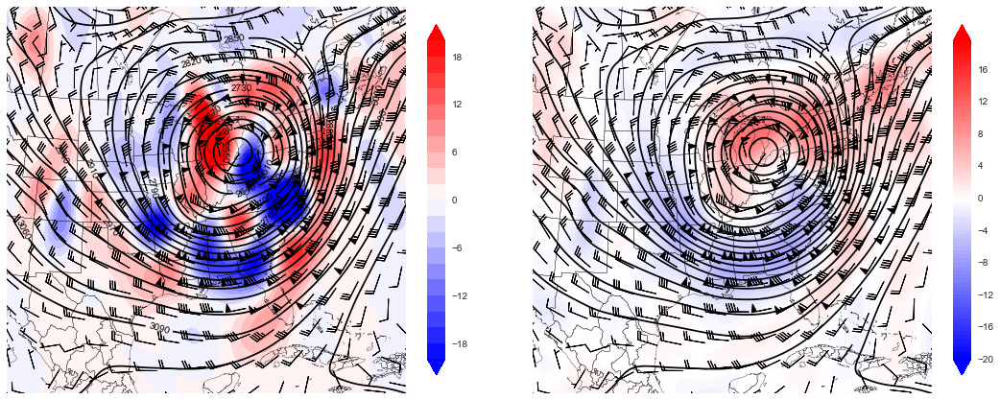

In [655]:
clev_omega = np.arange(-20, 21, 2)
wind_slice=(slice(None, None, 10), slice(None, None, 10))
ukts = ugeo700.metpy.unit_array.to('kts')
vkts = vgeo700.metpy.unit_array.to('kts')

vvsmth = mpcalc.smooth_n_point(vertical_velocity, 9, 50)

fig, axs = plt.subplots(1, 2, figsize=(18,12),subplot_kw=dict(projection=plot_crs))

axs[0].add_feature(cfeature.STATES.with_scale('10m'))

axs[0].set_extent([-110, -70, 20, 55])

term_a_cons = axs[0].contourf(x2d, y2d, total_QG_forcing*1e12, levels=clev_omega, extend='both', cmap='bwr', transform=data_crs, zorder=-1)
geocons = axs[0].contour(x2d, y2d, hght700s, levels=np.arange(0, 6000, 30), colors='black', transform=data_crs)

axs[0].barbs(x2d[wind_slice], y2d[wind_slice], ukts[wind_slice].m,
         vkts[wind_slice].m, length=6.5, transform=data_crs)

axs[0].clabel(geocons, fmt="%d")
fig.colorbar(term_a_cons,ax=axs[0], orientation='vertical', fraction=0.04)

axs[1].add_feature(cfeature.STATES.with_scale('10m'))

axs[1].set_extent([-110, -70, 20, 55])

vvcons = axs[1].contourf(x2d, y2d, -vvsmth, levels=np.arange(-20, 20, 0.5), extend='both', cmap='bwr', transform=data_crs, zorder=-1)
geocons = axs[1].contour(x2d, y2d, hght700s, levels=np.arange(0, 6000, 30), colors='black', transform=data_crs)
axs[1].barbs(x2d[wind_slice], y2d[wind_slice], ukts[wind_slice].m,
         vkts[wind_slice].m, length=6.5, transform=data_crs)

fig.colorbar(vvcons, ax=axs[1], orientation='vertical', fraction=0.04)
plt.show()

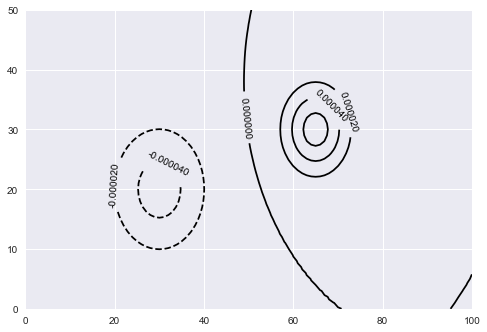

In [666]:
import numpy as np
import matplotlib.pyplot as plt

A1 = 7e-5
A2 = 4.9e-5
s1 = 5.0
s2 = 7.5
r1 = lambda x, y: np.sqrt((x-65.0)**2 + (y - 30.0)**2)
r2 = lambda x, y: np.sqrt((x-30.0)**2 + (y - 20.0)**2)

eps = 1e-7
nx = 101
ny = 51
dx = 200000

xgrid = np.arange(nx)
ygrid = np.arange(ny)

vort_field = np.zeros((nx, ny))
for i in range(nx):
    for j in range(ny):
        vort_field[i, j] = A1*np.exp(-(r1(i, j)**2)/(2*s1**2)) - A2*np.exp(-(r2(i, j)**2)/(2*s2**2))

cons = plt.contour(xgrid, ygrid, vort_field.T, levels=np.arange(-6e-5, 8e-5, 2e-5), colors='black')
plt.clabel(cons, fmt='%3f')
plt.show()

In [689]:
def new_laplacian(p0, p1, p2, p3, p4):
    
    result = (p1 + p2 + p3 + p4 - 4*p0)/(dx**2)
    return result

guess_stream = np.zeros((nx, ny))

t = np.cos(np.pi/nx) + np.cos(np.pi/ny)
alpha = (8 - 4*np.sqrt(4-t**2))/(t**2)
factor = (dx**2)/4
laplace = lambda G, x, y: (G[x-1,y] + G[x+1,y] + G[x, y-1] + G[x, y+1] - 4*G[x, y])/(dx**2)
        
residuals = np.zeros((nx, ny))
residuals[1:nx-1,1:ny-1] = new_laplacian(guess_stream[1:nx-1, 1:ny-1], guess_stream[0:nx-2, 1:ny-1], guess_stream[2:nx, 1:ny-1], guess_stream[1:nx-1, 0:ny-2], guess_stream[1:nx-1, 2:ny]) - vort_field[1:nx-1, 1:ny-1]

if np.abs(residuals < eps).all():
    streamsolution = guess_stream
    
else:
    counter = 0
    while np.abs(residuals > eps).any():
        
        guess_stream[1:nx-1,1:ny-1] = guess_stream[1:nx-1, 1:ny-1] + factor*residuals[1:nx-1, 1:ny-1]
        residuals[1:nx-1,1:ny-1] = new_laplacian(guess_stream[1:nx-1, 1:ny-1], guess_stream[0:nx-2, 1:ny-1], guess_stream[2:nx, 1:ny-1], guess_stream[1:nx-1, 0:ny-2], guess_stream[1:nx-1, 2:ny]) - vort_field[1:nx-1, 1:ny-1]

In [692]:
guess_stream

array([[      0.        ,       0.        ,       0.        , ...,
              0.        ,       0.        ,       0.        ],
       [      0.        ,  265649.10931028,  530182.90869316, ...,
         353887.20995325,  176939.12556948,       0.        ],
       [      0.        ,  532381.81938903, 1062540.42171179, ...,
         707791.02914657,  353881.82170235,       0.        ],
       ...,
       [      0.        , -156555.10912583, -312977.42303334, ...,
        -438539.50174544, -219774.52972389,       0.        ],
       [      0.        ,  -78241.92274597, -156415.67842453, ...,
        -218761.77728986, -109633.29965568,       0.        ],
       [      0.        ,       0.        ,       0.        , ...,
              0.        ,       0.        ,       0.        ]])

<a list of 6 text.Text objects>

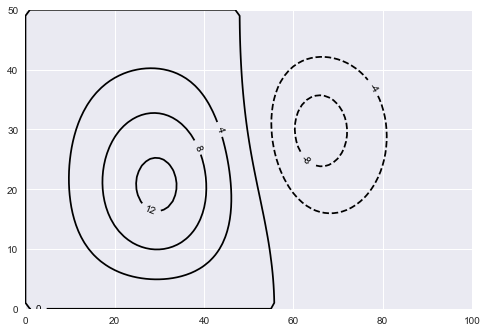

In [695]:
cons = plt.contour(xgrid, ygrid, guess_stream.T*1e-7, colors='k', levels=np.arange(-8, 16, 4))

plt.clabel(cons, fmt='%d')

In [708]:
guess_stream = np.zeros((nx, ny))

a=-5e6
b=7.4e8
guess_stream[:,:] = a*ygrid + b

In [709]:
residuals = np.zeros((nx, ny))
residuals[1:nx-1,1:ny-1] = new_laplacian(guess_stream[1:nx-1, 1:ny-1], guess_stream[0:nx-2, 1:ny-1], guess_stream[2:nx, 1:ny-1], guess_stream[1:nx-1, 0:ny-2], guess_stream[1:nx-1, 2:ny]) - vort_field[1:nx-1, 1:ny-1]

if np.abs(residuals < eps).all():
    streamsolution = guess_stream
    
else:
    counter = 0
    while np.abs(residuals > eps).any():
        
        guess_stream[1:nx-1,1:ny-1] = guess_stream[1:nx-1, 1:ny-1] + factor*residuals[1:nx-1, 1:ny-1]
        residuals[1:nx-1,1:ny-1] = new_laplacian(guess_stream[1:nx-1, 1:ny-1], guess_stream[0:nx-2, 1:ny-1], guess_stream[2:nx, 1:ny-1], guess_stream[1:nx-1, 0:ny-2], guess_stream[1:nx-1, 2:ny]) - vort_field[1:nx-1, 1:ny-1]

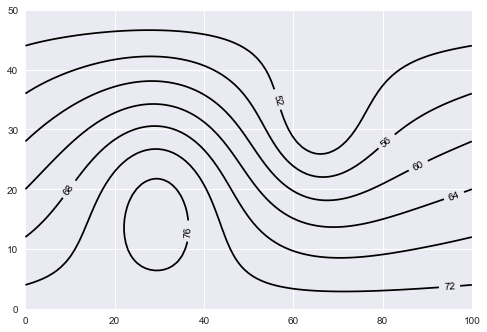

In [714]:
newcons = plt.contour(xgrid, ygrid, guess_stream.T*1e-7, colors='black')
plt.clabel(newcons, fmt='%d')
plt.show()

<a list of 7 text.Text objects>

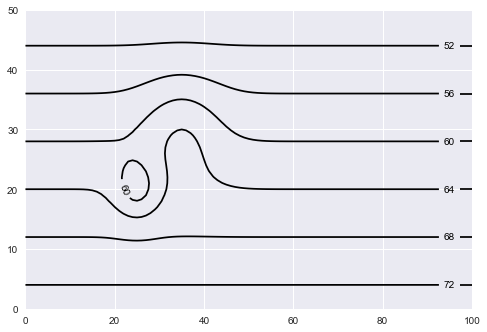

In [761]:
def laplacian2(stream, nx, ny, dx):
    
    slice1 = slice(1,nx-1)
    slice2 = slice(0,nx-2)
    slice3 = slice(2,nx)
    slice4 = slice(1, ny-1)
    slice5 = slice(0, ny-2)
    slice6 = slice(2, ny)
    
    result = (stream[slice2, slice4]+stream[slice3,slice4]+stream[slice1,slice5]+stream[slice1,slice6]-4*stream[slice1,slice4])/(dx**2)
    return result
    
    

A = -5e6
B = 7.4e8
C = -6e7
D = 5e7
s1 = 3.5
s2 = 6.0
nx = 101
ny = 51
dx = 2e5
dt = 900

xgrid = np.arange(nx)
ygrid = np.arange(ny)

x2d, y2d = np.meshgrid(xgrid, ygrid)
r1 = np.sqrt((x2d-25.0)**2 + (y2d - 20.0)**2)
r2 = np.sqrt((x2d-35.0)**2 + (y2d - 30.0)**2)

stream0 = (A*y2d + B + C*np.exp(-(r1)**2/(2*s1**2))+D*np.exp(-(r2**2)/(2*s2**2))).T
initial_vort_field = np.zeros((nx, ny))
initial_vort_field[1:nx-1,1:ny-1]=laplacian2(stream0, nx, ny, dx)

streamcons = plt.contour(x2d, y2d, stream0.T*1e-7, colors='black')
plt.clabel(streamcons,fmt='%d')

In [ ]:
omega = 7.292e-5
eps = 1e-7

beta = 2*omega*np.cos(np.deg2rad(40))

def laplacian2(stream):
    
    result = np.zeros((nx, ny))
    slice1 = slice(1,nx-1)
    slice2 = slice(0,nx-2)
    slice3 = slice(2,nx)
    slice4 = slice(1, ny-1)
    slice5 = slice(0, ny-2)
    slice6 = slice(2, ny)
    
    result[1:nx-1,1:ny-1] = (stream[slice2, slice4]+stream[slice3,slice4]+stream[slice1,slice5]+stream[slice1,slice6]-4*stream[slice1,slice4])/(dx**2)
    return result

def laplacian3(stream, i, j):
    
    lapl = (stream[i-1,j] + stream[i+1,j] + stream[i, j-1] + stream[i, j+1] - 4*stream[i,j])/(dx**2)
    return lapl

def calculate_jacobian(stream, field):
    
    total_J = np.zeros((nx, ny))
    J1 = np.zeros((nx, ny))
    J2 = np.zeros((nx, ny))
    J3 = np.zeros((nx, ny))
    
    slice1 = slice(3,nx-1)
    slice2 = slice(1, nx-3)
    slice3 = slice(3, ny-1)
    slice4 = slice(1, ny-3)
    slice5 = slice(2, nx-2)
    slice6 = slice(2, ny-2)
    
    factor = 1/(4*dx**2)
    J1[2:nx-2,2:ny-2] = factor*((stream[slice1,slice6]-stream[slice2,slice6])*(field[slice5,slice3]-field[slice5,slice4])\
                 -(stream[slice5,slice3]-stream[slice5,slice4])*(field[slice1,slice6]-field[slice2,slice6]))
    
    J2[2:nx-2,2:ny-2] = factor*(stream[slice1,slice6]*(field[slice1,slice3]-field[slice1,slice4])-stream[slice2,slice6]*(field[slice2,slice3]-field[slice2,slice4])\
                 -stream[slice5,slice3]*(field[slice1,slice3]-field[slice2,slice3])-stream[slice5,slice4]*(field[slice1,slice4]-field[slice2,slice4]))
    
    J3[2:nx-2,2:ny-2] = factor*(field[slice5,slice3]*(stream[slice1,slice3]-stream[slice2,slice3])-field[slice5,slice4]*(stream[slice1,slice4]-stream[slice2,slice4])\
                 -field[slice1,slice6]*(stream[slice1,slice3]-stream[slice1,slice4])-field[slice2,slice6]*(stream[slice2,slice3]-stream[slice2,slice4]))
    
    total_J = (J1+J2+J3)/3
    
    return total_J

A = -5e6
B = 7.4e8
C = -6e7
D = 5e7
s1 = 3.5
s2 = 6.0
nx = 101
ny = 51
dx = 2e5
dt = 900
factor = (dx**2)/4
eps = 1e-10

xgrid = np.arange(nx)
ygrid = np.arange(ny)

x2d, y2d = np.meshgrid(xgrid, ygrid)
r1 = np.sqrt((x2d-25.0)**2 + (y2d - 20.0)**2)
r2 = np.sqrt((x2d-35.0)**2 + (y2d - 30.0)**2)

stream0 = (A*y2d + B + C*np.exp(-(r1)**2/(2*s1**2))+D*np.exp(-(r2**2)/(2*s2**2))).T
initial_vort_field=laplacian2(stream0)
print(initial_vort_field.shape)

t = (0.5)*(np.cos(np.pi/nx) + np.cos(np.pi/ny))
alpha = ((8 - (4*np.sqrt(4 - (t**2))))/(t**2))

time_steps = int((72*60*60)/dt)
initial_jacobian=np.zeros((nx,ny))
initial_jacobian = calculate_jacobian(stream0, initial_vort_field)
print('First jacobian', initial_jacobian)
v0 = np.zeros((nx,ny))
v0[1:nx-1,1:ny-1] = (stream0[2:nx,1:ny-1]-stream0[0:nx-2,1:ny-1])/(4*dx**2)
new_vort_field = np.zeros((nx,ny))
new_vort_field = initial_vort_field - dt*(initial_jacobian + beta*v0)
print('NewVortfield', new_vort_field)
residuals = np.zeros((nx, ny))
new_stream = stream0.copy()
residuals = laplacian2(new_stream) - new_vort_field
print('First Laplacian', laplacian2(new_stream))
print((np.abs(residuals) < eps).all())
if (np.abs(residuals) < eps).all():
    streamsolution = new_stream
    
else:
    counter = 0
    print(counter)
    while (np.abs(residuals) > eps).any():
        
        if counter == 1:
            print(new_stream)
        
        new_stream += factor*residuals
        residuals = laplacian2(new_stream) - new_vort_field
        counter+=1

print('First iteration', new_stream)
total_stream_function = np.zeros((time_steps, nx, ny))
total_stream_function[0,:,:] = stream0
total_stream_function[1,:,:] = new_stream
vort_fields = np.zeros((time_steps, nx, ny))
vort_fields[0,:,:] = initial_vort_field
vort_fields[1,:,:] = new_vort_field

for tstep in range(1, time_steps-1):
    
    stream_new = total_stream_function[tstep]
    new0_vort = vort_fields[tstep]
    new_jacobian = calculate_jacobian(stream_new, new0_vort)
    print(stream_new)
    v = np.zeros((nx,ny))
    v[1:nx-1,1:ny-1] = (stream_new[2:nx,1:ny-1]-stream_new[0:nx-2,1:ny-1])/(4*dx**2)
    vort_fields[tstep+1]=vort_fields[tstep-1] - 2*dt*(new_jacobian+beta*v)
    residuals = np.zeros((nx,ny))
    guess0 = total_stream_function[0].copy()
    residuals = laplacian2(guess0) - vort_fields[tstep+1]
    if (np.abs(residuals) < eps).all():
        total_stream_function[tstep+1] = guess0
        
    else:
        counter=0
        while (np.abs(residuals) > eps).any():
            
            guess0 += factor*residuals
            residuals = laplacian2(guess0) - vort_fields[tstep+1]
            
        total_stream_function[tstep+1] = guess0
        
    print(tstep)
    if tstep == 10:
        print(guess0)
        break

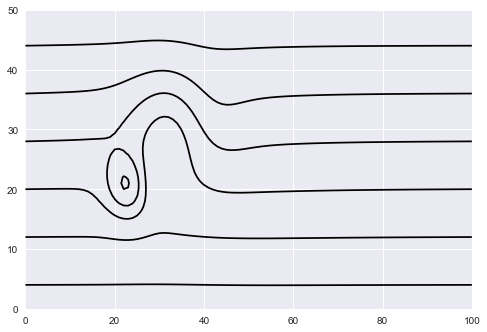

In [980]:
plt.contour(x2d, y2d, new_stream.T*1e-7, colors='black')

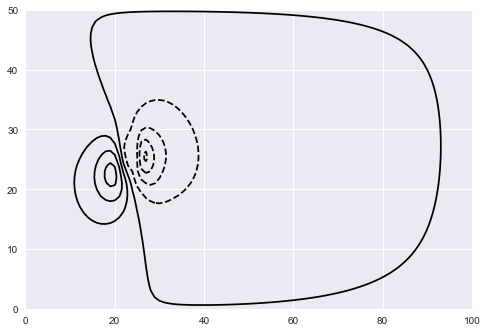

In [981]:
plt.contour(x2d, y2d, total_stream_function[5].T*1e-7, colors='black')

In [812]:
alpha

1.906987248561017

In [9]:
import numpy as np
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib.pyplot as plt
import metpy.calc as mpcalc
from metpy.units import units
import xarray as xr
import pathlib
import pandas as pd
from metpy.interpolate import interpolate_to_isosurface
import matplotlib.patheffects as path_effects

def time_formatter(time_val):
    
    x = pd.to_datetime(time_val)
    return f'{x.year}-{str(x.month).zfill(2)}-{str(x.day).zfill(2)} {str(x.hour).zfill(2)} UTC'

new_dir = pathlib.Path.home() / 'OneDrive - The Ohio State University'
upper_file = new_dir / 'Jan_1978' / 'Data' / 'Jan_1978_upper_data.nc'
sfc_file = new_dir / 'Jan_1978' / 'Data' / 'Jan_1978_sfc_data.nc'

plot_crs = ccrs.LambertConformal(central_longitude=-100, central_latitude=40)
data_crs = ccrs.PlateCarree()
upper_data = xr.open_dataset(upper_file)
surface_data = xr.open_dataset(sfc_file)

parsed_upper_data = upper_data.metpy.parse_cf()
parsed_sfc_data = surface_data.metpy.parse_cf()

lons = parsed_upper_data.longitude.values
lats = parsed_upper_data.latitude.values
lon2d, lat2d = np.meshgrid(lons, lats)
tidx = 78
plevel = 850.
lon_slice = (-83.5, -82.5)
lat_slice = (39.5, 40.5)

sfc_temp = parsed_sfc_data.t2m.metpy.sel(longitude=lon_slice, latitude=lat_slice).metpy.unit_array.to('degF')

print(sfc_temp.mean(axis=(1,2)))

Found valid latitude/longitude coordinates, assuming latitude_longitude for projection grid_mapping variable
Found valid latitude/longitude coordinates, assuming latitude_longitude for projection grid_mapping variable
Found valid latitude/longitude coordinates, assuming latitude_longitude for projection grid_mapping variable
Found valid latitude/longitude coordinates, assuming latitude_longitude for projection grid_mapping variable
Found valid latitude/longitude coordinates, assuming latitude_longitude for projection grid_mapping variable
Found valid latitude/longitude coordinates, assuming latitude_longitude for projection grid_mapping variable
Found valid latitude/longitude coordinates, assuming latitude_longitude for projection grid_mapping variable
Found valid latitude/longitude coordinates, assuming latitude_longitude for projection grid_mapping variable
Found valid latitude/longitude coordinates, assuming latitude_longitude for projection grid_mapping variable
Found valid latitud

[9.089881896972656 9.09283447265625 3.954349994659424 4.137560844421387 4.688930511474609 2.9948935508728027 3.6707587242126465 3.5627012252807617 1.7729666233062744 1.915651559829712 1.580369472503662 1.0929954051971436 1.6531745195388794 2.046018123626709 8.017093658447266 7.037662982940674 8.384682655334473 19.35974884033203 19.022716522216797 19.114315032958984 25.506406784057617 25.27095603942871 18.104354858398438 19.026823043823242 19.128995895385742 19.16070556640625 15.416220664978027 15.762070655822754 15.974051475524902 15.393905639648438 15.739754676818848 15.82196044921875 16.2071533203125 16.26354217529297 16.1889591217041 16.1701717376709 15.86600112915039 15.84779167175293 22.71552276611328 25.15882682800293 25.764188766479492 33.44341278076172 33.75403594970703 33.29132080078125 34.51618576049805 35.45510482788086 35.75927734375 36.19496536254883 36.34996795654297 36.378753662109375 36.422203063964844 36.115108489990234 35.967132568359375 36.066368103027344 36.19964599

In [10]:
parsed_sfc_data

<xarray.Dataset>
Dimensions:    (longitude: 361, latitude: 221, time: 144)
Coordinates:
  * longitude  (longitude) float32 -140.0 -139.8 -139.5 ... -50.5 -50.25 -50.0
  * latitude   (latitude) float32 70.0 69.75 69.5 69.25 ... 15.5 15.25 15.0
  * time       (time) datetime64[ns] 1978-01-23 ... 1978-01-28T23:00:00
    metpy_crs  object Projection: latitude_longitude
Data variables:
    u10        (time, latitude, longitude) float32 ...
    v10        (time, latitude, longitude) float32 ...
    d2m        (time, latitude, longitude) float32 ...
    t2m        (time, latitude, longitude) float32 ...
    msl        (time, latitude, longitude) float32 ...
    tp         (time, latitude, longitude) float32 ...
Attributes:
    Conventions:  CF-1.6
    history:      2022-10-13 13:55:01 GMT by grib_to_netcdf-2.25.1: /opt/ecmw...